In [1]:
import scanpy as sc
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import matplotlib.patches as patches
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
from tqdm.notebook import tqdm
import itertools as it
import seaborn as sns
from scipy.stats import kde, pearsonr
import warnings

In [2]:
sc.settings.verbosity = 4
sc.settings.set_figure_params(dpi=80)

In [3]:
prefix = '/data/xyzeq/xyzeq/'

### Load in the XYZeq data

Make an experiments dictionary to organize everything:

In [4]:
exps = dict()
for exp in range(6):
    exps[exp] = dict()

In [5]:
exps[0]['path'] = prefix + 'individual.raw.and.proc.h5ads/20191210/20191210_L10C.h5ad' # deep
exps[1]['path'] = prefix + 'individual.raw.and.proc.h5ads/20190920/20190920_L20C1.h5ad' # deep
exps[2]['path'] = prefix + 'individual.raw.and.proc.h5ads/20190920/20190920_L20T.h5ad' # deep
exps[3]['path'] = prefix + 'individual.raw.and.proc.h5ads/20191210/20191210_L20C.h5ad' # deep
exps[4]['path'] = prefix + 'individual.raw.and.proc.h5ads/20190831/20180831_L30C.h5ad' # shallow
exps[5]['path'] = prefix + 'individual.raw.and.proc.h5ads/20190831/20180831_L30C8.h5ad' # shallow

Make labels of "adata", "adata_hg" for human genes only, and "adata_mg" for mouse genes only.

In [6]:
for exp in exps:
    exps[exp]['adata'] = sc.read_h5ad(exps[exp]['path'])

In [7]:
for exp in exps:
    exps[exp]['label'] = exps[exp]['path'].split('_')[-1].strip('.h5ad')

In [8]:
for exp in exps:
    exps[exp]['adata_hg'] = exps[exp]['adata'][:,[i for i in exps[exp]['adata'].var_names if i.startswith('hg19_')]].copy()
    exps[exp]['adata_mg'] = exps[exp]['adata'][:,[i for i in exps[exp]['adata'].var_names if i.startswith('mm10_')]].copy()

Use scanpy's filter cells with a min 0 counts just to add an 'n_counts' key in the obs. This doesn't actually filter the cells at all.

In [9]:
for exp in exps:
    for adata in ['adata','adata_hg', 'adata_mg']:
        sc.pp.filter_cells(exps[exp][adata], min_counts=0)
        exps[exp][adata + '-filter_cells_n_counts'] = exps[exp][adata].obs['n_counts'].sort_values(ascending=False)

### Begin making plots

Here's the standard 10x knee plot of all the compartments. We see some interesting shapes in all of them.

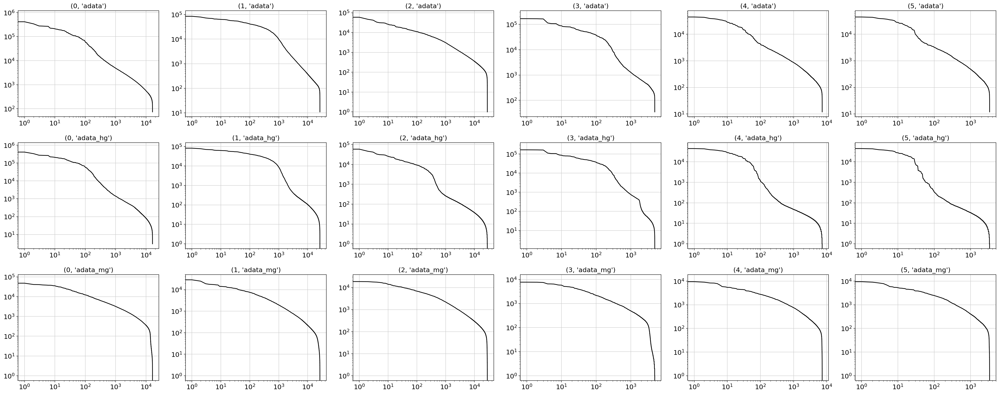

In [10]:
fig, ax = plt.subplots(3, 6, figsize=(30,12))
for prod, ax in zip(it.product(range(6), ['adata','adata_hg', 'adata_mg']), np.ravel(ax.T)):
    ax.plot(exps[prod[0]][prod[1] + '-filter_cells_n_counts'].values, color='k')
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_title(prod)
plt.tight_layout()

In the past few weeks, I've been utilizing another visualization tool for experiments where we cross-aligned to two genomes. Visualizing the knee plot for each genome but _also_ density plotting the number of UMIs for the same barcodes (in their ranked position). This is a really nice way to visualize ambient RNA. Think of it as aligning to one genome and spiking in control RNA that aligns to the other genome. 

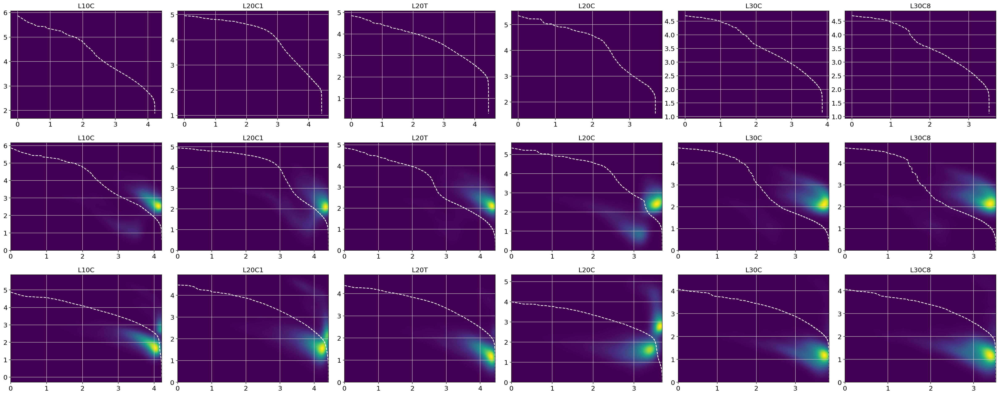

In [11]:
fig, ax = plt.subplots(3, 6, figsize=(30,12))
nbins=300
cmap = plt.cm.get_cmap('viridis')
base_color = cmap(0)
for prod, ax in zip(it.product(range(6), ['adata', 'adata_hg', 'adata_mg']), np.ravel(ax.T)):
    ax.set_facecolor(base_color)
    series = exps[prod[0]][prod[1] + '-filter_cells_n_counts']
    x = np.log10(np.arange(len(series)) + 1)
    y = np.log10(series.values + 1)
    ax.plot(x, y, color='white', linestyle='--')
    if prod[1] != 'adata':
        if prod[1] == 'adata_hg':
            y_d = np.log10(exps[prod[0]]['adata_mg'].obs['n_counts'][series.index.values].values + 1)
        else:
            y_d = np.log10(exps[prod[0]]['adata_hg'].obs['n_counts'][series.index.values].values + 1)
        k = kde.gaussian_kde([x,y_d])
        xi, yi = np.mgrid[x.min():x.max():nbins*1j, y_d.min():y_d.max():nbins*1j]
        zi = k(np.vstack([xi.flatten(), yi.flatten()]))
        # Make the plot
        ax.pcolormesh(xi, yi, zi.reshape(xi.shape))
    ax.set_title(exps[prod[0]]['label'])
    ax.grid(False)
    ax.grid(True, 'both', 'both')
plt.tight_layout()

Here's the same thing in scatterplot form.

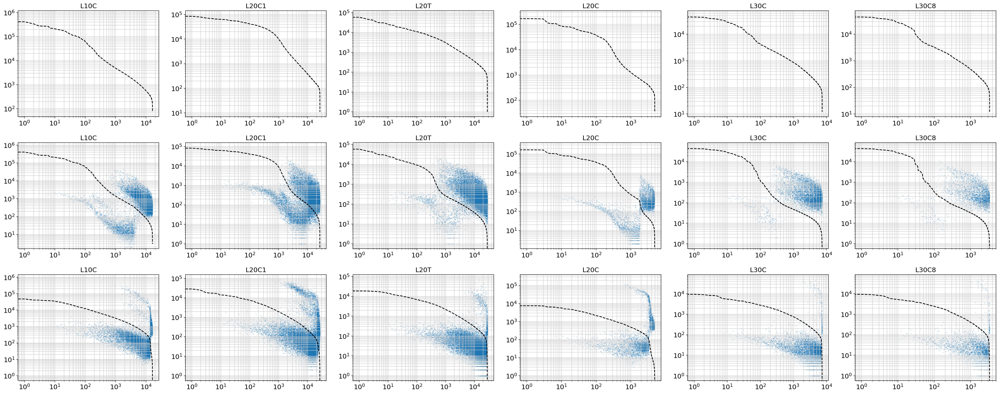

In [44]:
fig, ax = plt.subplots(3, 6, figsize=(30,12))
for prod, ax in zip(it.product(range(6), ['adata', 'adata_hg', 'adata_mg']), np.ravel(ax.T)):
    series = exps[prod[0]][prod[1] + '-filter_cells_n_counts']
    x = np.arange(len(series))
    y = series.values
    ax.plot(x, y, color='k', linestyle='--')
    if prod[1] != 'adata':
        if prod[1] == 'adata_hg':
            y_d = exps[prod[0]]['adata_mg'].obs['n_counts'][series.index.values].values
        else:
            y_d = exps[prod[0]]['adata_hg'].obs['n_counts'][series.index.values].values
        ax.scatter(x, y_d, s=3, alpha=0.3, linewidth=0)
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_title(exps[prod[0]]['label'])
    ax.grid(False)
    ax.grid(True, 'both', 'both')
plt.tight_layout()

In the end, I want to take those mouse cells ranked lowly on the human UMI plot (and vice versa) and only those with a certain log fold difference higher mouse UMIs than human. I think that will capture all the cells we want, while not compromising on picking up background. Right now, revisualizing in desnity plot form but with only those that are above the knee plot (i.e., only those cells that have more UMIs of the opposite genome).

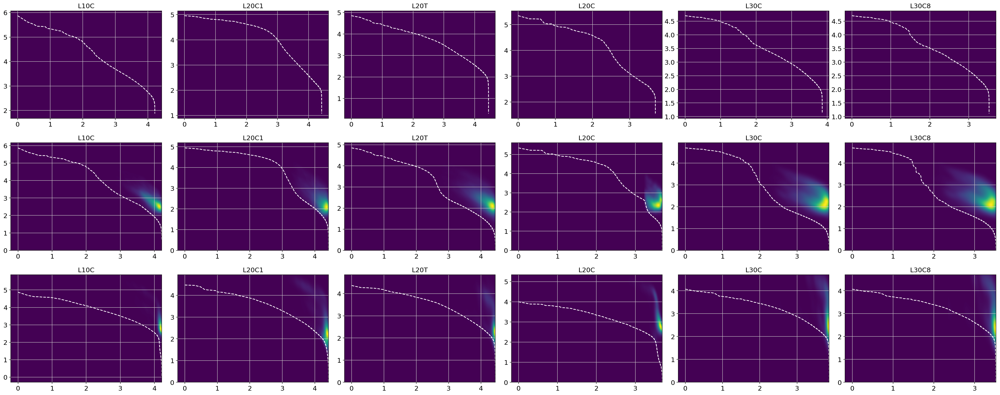

In [67]:
fig, ax = plt.subplots(3, 6, figsize=(30,12))
nbins=300
cmap = plt.cm.get_cmap('viridis')
base_color = cmap(0)
for prod, ax in zip(it.product(range(6), ['adata', 'adata_hg', 'adata_mg']), np.ravel(ax.T)):
    ax.set_facecolor(base_color)
    series = exps[prod[0]][prod[1] + '-filter_cells_n_counts']
    x = np.log10(np.arange(len(series)) + 1)
    y = np.log10(series.values + 1)
    ax.plot(x, y, color='white', linestyle='--')
    if prod[1] != 'adata':
        if prod[1] == 'adata_hg':
            y_d = np.log10(exps[prod[0]]['adata_mg'].obs['n_counts'][series.index.values].values + 1)
        else:
            y_d = np.log10(exps[prod[0]]['adata_hg'].obs['n_counts'][series.index.values].values + 1)
        x_sub = x[[j - m >= 0 for j, m in zip(y_d, y)]]
        y_d_sub = y_d[[j - m >= 0 for j, m in zip(y_d, y)]]
        k = kde.gaussian_kde([x_sub,y_d_sub])
        xi, yi = np.mgrid[x_sub.min():x_sub.max():nbins*1j, y_d.min():y_d.max():nbins*1j]
        zi = k(np.vstack([xi.flatten(), yi.flatten()]))
        # Make the plot
        ax.pcolormesh(xi, yi, zi.reshape(xi.shape))
    ax.set_title(exps[prod[0]]['label'])
    ax.grid(False)
    ax.grid(True, 'both', 'both')
plt.tight_layout()

Okay, I painfully went through each batch and drew some good thresholds for the cutoffs. I decided to use a UMI cutoff in addition to distance above the line. "Starts" is just where I'm going to start plotting for visualization purposes. These are what I ended with:

In [10]:
dist_thresholds = [[0.4, 0.3], [0.25, 0.35], [0.5, 0.25], [0.2, 0.8], [0.5, 0.2], [0.5, 0.2]]
# dist_thresholds = [[0.1, 0], [0.1, 0], [0.1, 0], [0.1, 0], [0.1, 0], [0.1, 0]]

UMI_cutoffs = [[2.1, 2.4], [1.8, 1.9], [1.7, 1.9], [2, 2.3], [1.5, 1.9], [1.5, 1.9]]
# UMI_cutoffs = [[np.log10(400), 2.4], [np.log10(200), 1.9], [np.log10(300), 1.9], [np.log10(200), 2.3], [np.log10(200), 1.9], [np.log10(200), 1.9]]

starts = [[1000, 1000], [1000, 1000], [1500, 1500], [1000, 1000], [100, 1000], [100, 1000]]

Now I will plot with a red line, which will be the threshold for cells above which we will keep for each called cell barcode.

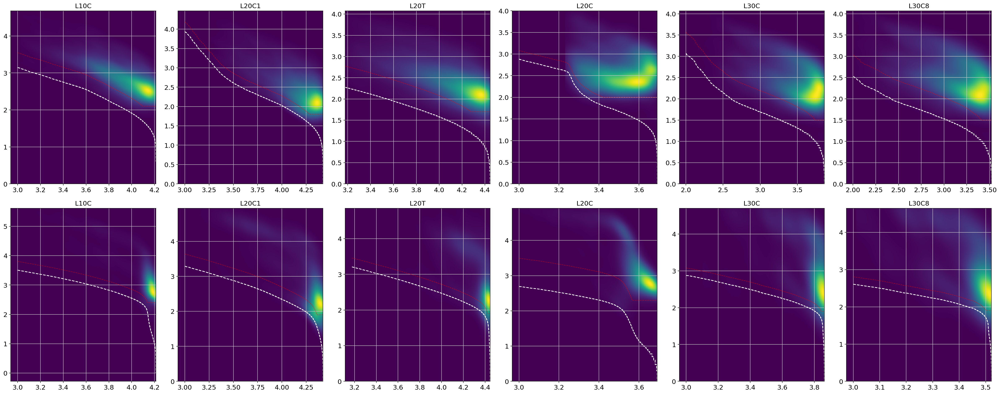

In [14]:
fig, ax = plt.subplots(2, 6, figsize=(30,12))
nbins=300
cmap = plt.cm.get_cmap('viridis')
base_color = cmap(0)
for prod, ax, c, d, s in zip(it.product(range(6), ['adata_hg', 'adata_mg']), np.ravel(ax.T), 
                             [i for j in UMI_cutoffs for i in j], 
                             [i for j in dist_thresholds for i in j], 
                             [i for j in starts for i in j]):
    ax.set_facecolor(base_color)
    series = exps[prod[0]][prod[1] + '-filter_cells_n_counts']
    x = np.log10(np.arange(len(series))[s:] + 1)
    y = np.log10(series.values[s:] + 1)
    ax.plot(x, y, color='white', linestyle='--')
    if prod[1] == 'adata_hg':
        y_d = np.log10(exps[prod[0]]['adata_mg'].obs['n_counts'][series.index.values].values[s:] + 1)
    else:
        y_d = np.log10(exps[prod[0]]['adata_hg'].obs['n_counts'][series.index.values].values[s:] + 1)
    keep_bool = [(j - k >= 0) & (j >= 0) for j, k in zip(y_d, y)]
    x_sub = x[keep_bool]
    y_d_sub = y_d[keep_bool]
    k = kde.gaussian_kde([x_sub,y_d_sub])
    xi, yi = np.mgrid[x_sub.min():x_sub.max():nbins*1j, y_d.min():y_d.max():nbins*1j]
    zi = k(np.vstack([xi.flatten(), yi.flatten()]))
    # Make the plot
    ax.pcolormesh(xi, yi, zi.reshape(xi.shape))
    ax.set_title(exps[prod[0]]['label'])
    ax.grid(False)
    ax.grid(True, 'both', 'both')
    ax.plot(x, np.where(y + d > c, y + d, c), color='red', linestyle='--', linewidth=1, alpha=0.5)
plt.tight_layout()

Great, the thresholds look great. Now to actually extract out the cells.

In [11]:
for prod, c, d in zip(it.product(range(6), ['adata_hg', 'adata_mg']), 
                      [i for j in UMI_cutoffs for i in j], 
                      [i for j in dist_thresholds for i in j]):
    series = exps[prod[0]][prod[1] + '-filter_cells_n_counts']
    x = np.log10(np.arange(len(series)) + 1)
    y = np.log10(series.values + 1)
    if prod[1] == 'adata_hg':
        y_d = np.log10(exps[prod[0]]['adata_mg'].obs['n_counts'][series.index.values].values + 1)
        keep_cells = series.index.values[[(j - k >= d) & (j >= c) for j, k in zip(y_d, y)]]
        exps[prod[0]]['mouse_cells'] = keep_cells
    else:
        y_d = np.log10(exps[prod[0]]['adata_hg'].obs['n_counts'][series.index.values].values + 1)
        keep_cells = series.index.values[[(j - k >= d) & (j >= c) for j, k in zip(y_d, y)]]
        exps[prod[0]]['human_cells'] = keep_cells

Every cell I called in the mouse plot should have higher mouse UMIs than human UMIs, and vice versa for the human plot. Therefore, the overlap between them should be 0.

In [12]:
for exp in exps:
    print(len(np.intersect1d(exps[exp]['mouse_cells'], exps[exp]['human_cells'])))

0
0
0
0
0
0


Excellent. I think this is going to allow us to keep so many more cells than what we had before.

In [13]:
for exp in exps:
    print('Label: ' + exps[exp]['label'] + ', Mouse: ' + str(len(exps[exp]['mouse_cells'])) + ', Human: ' + str(len(exps[exp]['human_cells'])))

Label: L10C, Mouse: 12455, Human: 2822
Label: L20C1, Mouse: 16429, Human: 6047
Label: L20T, Mouse: 23703, Human: 1269
Label: L20C, Mouse: 2953, Human: 1781
Label: L30C, Mouse: 6639, Human: 279
Label: L30C8, Mouse: 2982, Human: 158


That's great. We were seeing almost 0 human cells in the later batches (L30C and L30C8) with previous filtering, so the fact that we see at least some there is already better than what we were doing before.

Now, to use all information avaialble to us (i.e. even human gene "expression" in mouse compartments) I'm going to just filter the original matrices according to these cells (and I'll add an anotation in the obs). 

In [14]:
for exp in exps:
    org_list = ['mouse']*len(exps[exp]['mouse_cells']) + ['human']*len(exps[exp]['human_cells'])
    exps[exp]['adata'] = exps[exp]['adata'][np.concatenate([exps[exp]['mouse_cells'], exps[exp]['human_cells']]),:].copy()
    exps[exp]['adata'].obs['organism'] = org_list

Next code block commented out. I was experimenting with using percent mito as a cutoff and also separating out the cells into mouse and human adatas, but after experimenting with all these parameters, the UMAPs never looked as "good" (i.e. showing as much heterogeneity than when I just leave all %mito cells and plot all cells together). So it is recommended not to use these cutoffs and plot all cells together. Related code in the blocks folllowing this one is also commented out.

In [17]:
# for exp in exps:
#     exps[exp]['adata_m'] = exps[exp]['adata_mg'][exps[exp]['mouse_cells']].copy()
#     exps[exp]['adata_h'] = exps[exp]['adata_hg'][exps[exp]['human_cells']].copy()

# for exp in exps:
#     sc.pp.filter_cells(exps[exp]['adata_m'], min_counts=1)
#     sc.pp.filter_cells(exps[exp]['adata_h'], min_counts=1)

# mito_genes = dict()

# genelist_h = exps[0]['adata_h'].var_names.tolist()
# mito_genes['h'] = dict()
# mito_genes['h']['names'] = [gn for gn in genelist_h if gn.startswith('hg19_MT-')]
# mito_genes['h']['idxs'] = [genelist_h.index(gn) for gn in mito_genes['h']['names']]

# genelist_m = exps[0]['adata_m'].var_names.tolist()
# mito_genes['m'] = dict()
# mito_genes['m']['names'] = [gn for gn in genelist_m if gn.startswith('mm10_mt-')]
# mito_genes['m']['idxs'] = [genelist_m.index(gn) for gn in mito_genes['m']['names']]

# fig, ax = plt.subplots(2, 6, figsize=(30, 8))
# for prod, ax in zip(it.product(range(6), ['h', 'm']), np.ravel(ax.T)):
#     exp = prod[0]
#     g = prod[1]
    
#     mito_counts = np.ravel(exps[exp]['adata_%s' % g][:, mito_genes[g]['idxs']].X.sum(axis=1))
#     total_counts = np.ravel(exps[exp]['adata_%s' % g].X.sum(axis=1))
    
#     exps[exp]['adata_%s' % g].obs['percent_mito_%s' % g] = mito_counts / total_counts

#     ax.hist(exps[exp]['adata_%s' % g].obs['percent_mito_%s' % g].values,bins=200,density=True)
#     ax.vlines(0.2,0,100,color='r');

# for exp in exps:
#     exps[exp]['adata_m'] = exps[exp]['adata_m'][exps[exp]['adata_m'].obs['percent_mito_m'] < 0.2].copy()
#     exps[exp]['adata_h'] = exps[exp]['adata_h'][exps[exp]['adata_h'].obs['percent_mito_h'] < 0.2].copy()

Now to concatenate.

In [28]:
# concat_m = exps[0]['adata_m'].concatenate(*[exps[exp]['adata_m'] for exp in range(1, 6)], join='inner')
# concat_h = exps[0]['adata_h'].concatenate(*[exps[exp]['adata_h'] for exp in range(1, 6)], join='inner')
concat = exps[0]['adata'].concatenate(*[exps[exp]['adata'] for exp in range(1, 6)], join='inner')

In [29]:
# print(concat_m)
# print(concat_h)
print(concat)

AnnData object with n_obs × n_vars = 77517 × 121472 
    obs: 'batch', 'n_counts', 'organism'


`my_plot` function below

In [23]:
def my_plot(ax, vals, tupe=None, thresh=None, max_y=None):
    ax.hist(vals,bins=np.logspace(np.log10(0.1),np.log10(50000), 500),color='gray') # logspace bins looks great!
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_title(tupe)
    ax.grid(which='both', alpha=0.5)
    if thresh != None:
        ax.vlines(thresh,0,max_y)
    return

I don't know why I like this visualization more, but it _kind of_ shows two different regimes for the genes (for each metric being used): those that are expressing more than ~60 UMIs (and expressed in more than ~60 cells), and those that arent.

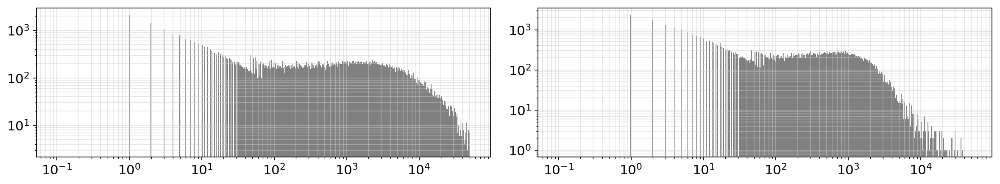

In [24]:
# for exp in exps:
fig, axes = plt.subplots(1,2,figsize=(15,3))
vals = sc.pp.filter_genes(concat, min_counts=0,inplace=False)[1] # total number of UMIs observed
my_plot(axes[0], vals)

vals = sc.pp.filter_genes(concat, min_cells=0,inplace=False)[1] # total number of UMIs observed
my_plot(axes[1], vals)

plt.tight_layout()
plt.show()

In [30]:
# sc.pp.filter_genes(concat_m, min_counts=60)
# sc.pp.filter_genes(concat_h, min_counts=60)
# sc.pp.filter_genes(concat_m, min_cells=60)
# sc.pp.filter_genes(concat_h, min_cells=60)

sc.pp.filter_genes(concat, min_counts=60)
sc.pp.filter_genes(concat, min_cells=60)

filtered out 83986 genes that are detectedin less than 60 counts
filtered out 3625 genes that are detectedin less than 60 cells


In [22]:
# concat_m.var_names = [i[5:] for i in concat_m.var_names]
# concat_h.var_names = [i[5:] for i in concat_h.var_names]

In [65]:
# concat_m_unnormed = concat_m.copy()
# concat_h_unnormed = concat_h.copy()

In [ ]:
# sc.pp.log1p(concat_m)
# sc.pp.normalize_per_cell(concat_m, counts_per_cell_after=1e6)
# sc.pp.log1p(concat_h)
# sc.pp.normalize_per_cell(concat_h, counts_per_cell_after=1e6)

Now to transform and do dimensionality reduction. Logically, it makes more sense to me to first normalize per cell, then take the log transform. However, I've noticed through experimentation that the UMAP looks worse when I flip these. I have no idea why, and it is definitely worth trying to figure out exactly why.

In [18]:
def process1(adata):
    # reverse the order of these and the UMAP looks 10x worse, 
    # I don't understand why, and logically I think it makes more sense reversed
    # But it looks terrible reversed
    sc.pp.log1p(adata) 
    sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e6)
    return adata

In [31]:
concat = process1(concat)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


### Highly-variable Gene Code

In [21]:
def hv_run(adata, flavor='cell_ranger', min_mean=0.0125, min_disp=0.5, max_mean=3, bins=500):    # Extract out highly variable genes, but don't subset just yet
    '''
    Run highly variable genes and return a new adata object, if provided.
    '''
    hv_adata = adata.copy() # make a copy because I don't want to change the original just yet
    sc.pp.highly_variable_genes(hv_adata, flavor=flavor,inplace=True, 
                                min_mean=min_mean, 
                                min_disp=min_disp, 
                                max_mean=max_mean,
                                n_bins=bins)
    
    means = hv_adata.var['means'].values
    means_sorted = np.unique(np.sort(means))
    if means_sorted[0] == 0:
        mean_shift = means_sorted[1]
    elif means_sorted[0] < 0:
        mean_shift = means_sorted[1] - 2*means_sorted[0]
    else:
        mean_shift = 0
    
    disps = hv_adata.var['dispersions_norm'].values
    disps_sorted = np.unique(np.sort(disps))
    if disps_sorted[0] == 0:
        disp_shift = disps_sorted[1]
    elif disps_sorted[0] < 0:
        disp_shift = disps_sorted[1] - 2*disps_sorted[0]
    else:
        disp_shift = 0
        
    log_means = np.log10(means + mean_shift)
    log_disps = np.log10(disps + disp_shift)
    
    hv_adata.var['log_means'] = log_means
    hv_adata.var['log_disps'] = log_disps
    
    return hv_adata

def hv_plot(hv_adata, gate=None, highlight_genes=None):
    '''
    Plot the means and normalized dispersions from the adata object provided. Choose to
    also plot a gate or highlight certain genes.
    '''
    plt.figure(figsize=(7,7)) # make a figure
    plt.minorticks_on() # throw on the minor ticks for use with the grid, will help with subsetting
    plt.grid(True,which='both',axis='both') # turn the grid on
    
    # do what the scanpy function does, plotting normalized dispersions with means as blue dots, 
    # I don't want to plot in logspace but I don't want to use the log function because then the gates don't work
    # if they contain segments with fractional slopes (i.e. non-straight lines). To be robust to these gates, I therefore 
    # will log10 everything and just plot in linear space
    log_means = hv_adata.var['log_means'].values
    log_disps = hv_adata.var['log_disps'].values
    
    plt.scatter(log_means, log_disps, s=0.5, c='b')
    if type(highlight_genes) != type(None): # do you want to highlight some genes?
        mask = [i in highlight_genes for i in hv_adata.var_names] # create a boolean mask of which genes to highlight
        highlight_means = log_means[mask] # subset only those means
        highlight_disps = log_disps[mask] # subset only those dispersions
        plt.scatter(highlight_means,highlight_disps,s=30, facecolors='none', edgecolors='r'); # plot with a red circle around the blue dot
    if type(gate) != type(None):
        # You can draw a gate around the genes you want. There should be a check for using only rectangular gates (or only polygons with right angles). 
        # I have noted that if you try to draw angled lines in log space using the shapely package, the points_in_poly function does not return the right subset of points within the polygon.
        ax = plt.gca() # if you want to add a gate
        gatepatch = patches.Polygon(gate,linewidth=1,edgecolor='teal',facecolor='turquoise',alpha=0.5) # create a matplotlib patch for the gate to the plot
        ax.add_patch(gatepatch); # add the gate to the plot

def hv_genes(hv_adata, gate, adata=None):
    '''
    Receive boolean for genes in gate or new subsetted adata object, if provided.
    '''
    # You can subset the genes you want using the gate. Again, there should be a check for using only rectangular gates (or only polygons with right angles). 
    # I have noted that if you try to draw angled lines in log space using the shapely package, the points_in_poly function does not return the right subset of points within the polygon.
    genes = list()
    log_means = hv_adata.var['log_means'].values
    log_disps = hv_adata.var['log_disps'].values
    
    pointsmap = map(Point,log_means,log_disps) # make each point a shapely.geometry.Point
    
    polygon = Polygon(gate) # make your gate a shapely.geometry.Polygon
    for i in pointsmap:
        genes.append(polygon.contains(i)) # this is the workhorse, determining which points are in the gate
    if type(adata) != type(None): # if the adata has been provided, subset it
        adata = adata[:,genes].copy()
        return adata
    else: # if it has not been provided return the boolean array noting which genes will be kept
        return genes

In [24]:
hv_adata = hv_run(concat, flavor='cell_ranger', bins=10)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


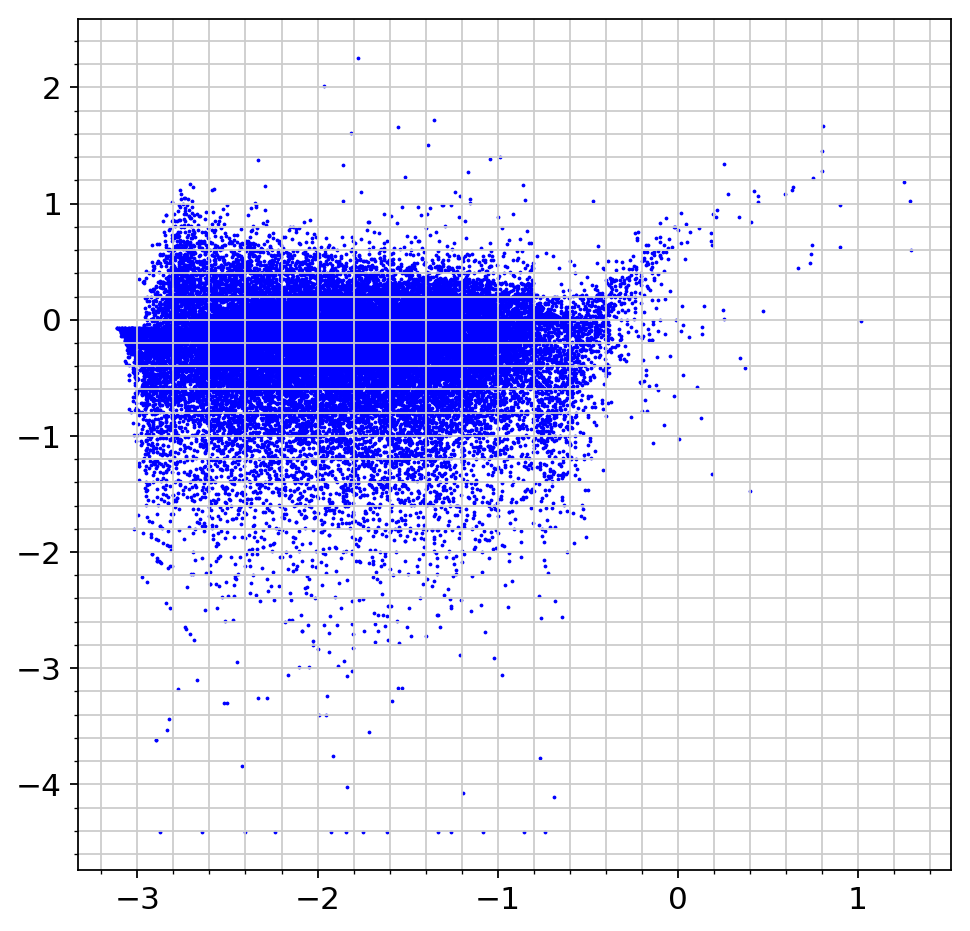

In [25]:
hv_plot(hv_adata)

In [26]:
good_genes = ['Ppara', 'Abbc2', 'Dpyd', 'Alb', 'Trf', 'Pigr', 'Apoc1', 'Apoa1', 'Ghr', 'Malat1', 'Tgfbi', 'Cd74', 'Cd5l', 'Ptprj', 'Adgb', 'Timd4', 'Fyb', 'Marco', 'Clec4f', 'Ptprm',
             'Stab2', 'Ptprb', 'Adgrl4', 'Cyyr1', 'Meis2', 'F8', 'Skap1', 'Inpp4b', 'Tox', 'Dock2', 'Itk', 'Ikzf2', 'Cd247', 'Arhgap15', 'Camk4', 'Ptprc', 'Prkcq']

bad_genes = ['Snx24', 'Sema5a', 'Foxp4', 'Cmss1', 'Camk1d', 'Gm42418', 'A530064D06Rik', 'Il31ra', 'Angpt1',  'Lars2', '9330185C12Rik', 'Dlgap1', 'Foxn3',  'Clasp1', 'Rnf152', 'Plcd1', 
             'Skint6', 'Lingo2', 'AA474408', 'Itpr2', 'Pigr', 'Spata5', 'Ccser1', 'Gm26561', 'Galnt18', 'Cdk8']

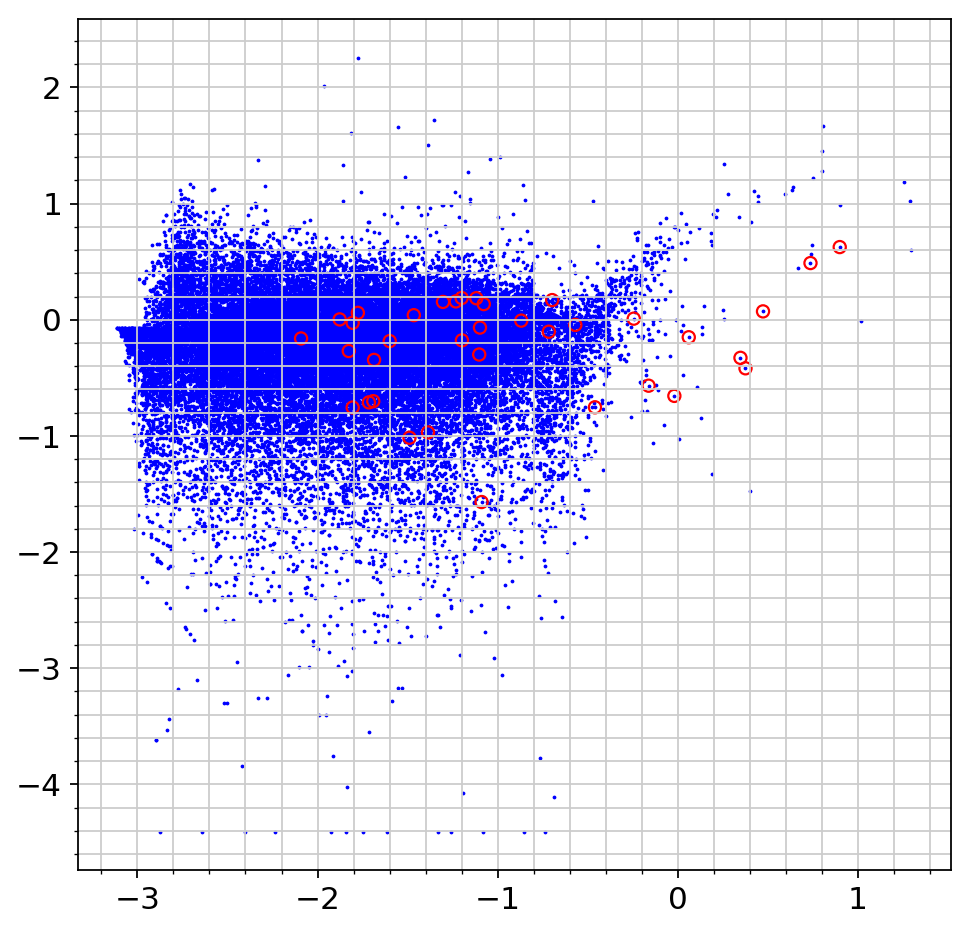

In [28]:
hv_plot(hv_adata, highlight_genes=['mm10_' + i for i in good_genes])

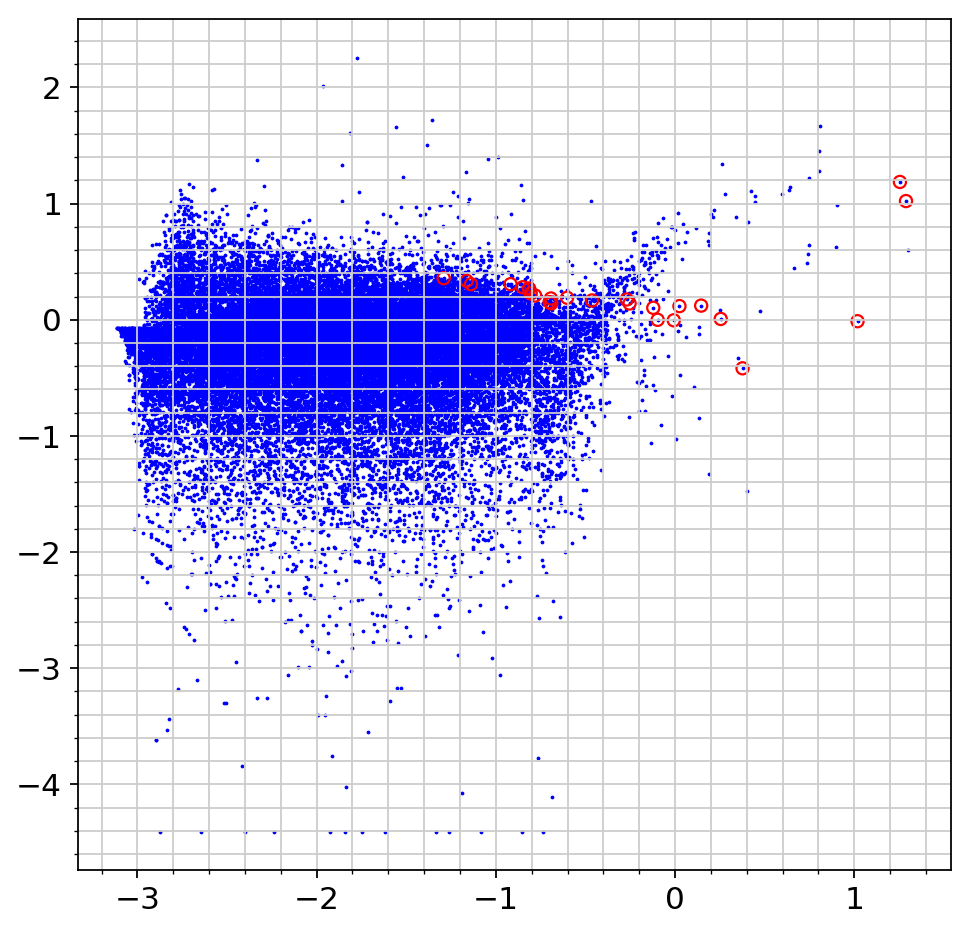

In [31]:
hv_plot(hv_adata, highlight_genes=['mm10_' + i for i in bad_genes])

In [73]:
xrange = (0.4, 1.2)
yrange = (0.6, 1.25)
gate = np.array([(xrange[0], yrange[0]), 
                  (xrange[0], yrange[1]), 
                  (xrange[1], yrange[1]), 
                  (xrange[1], yrange[0])])

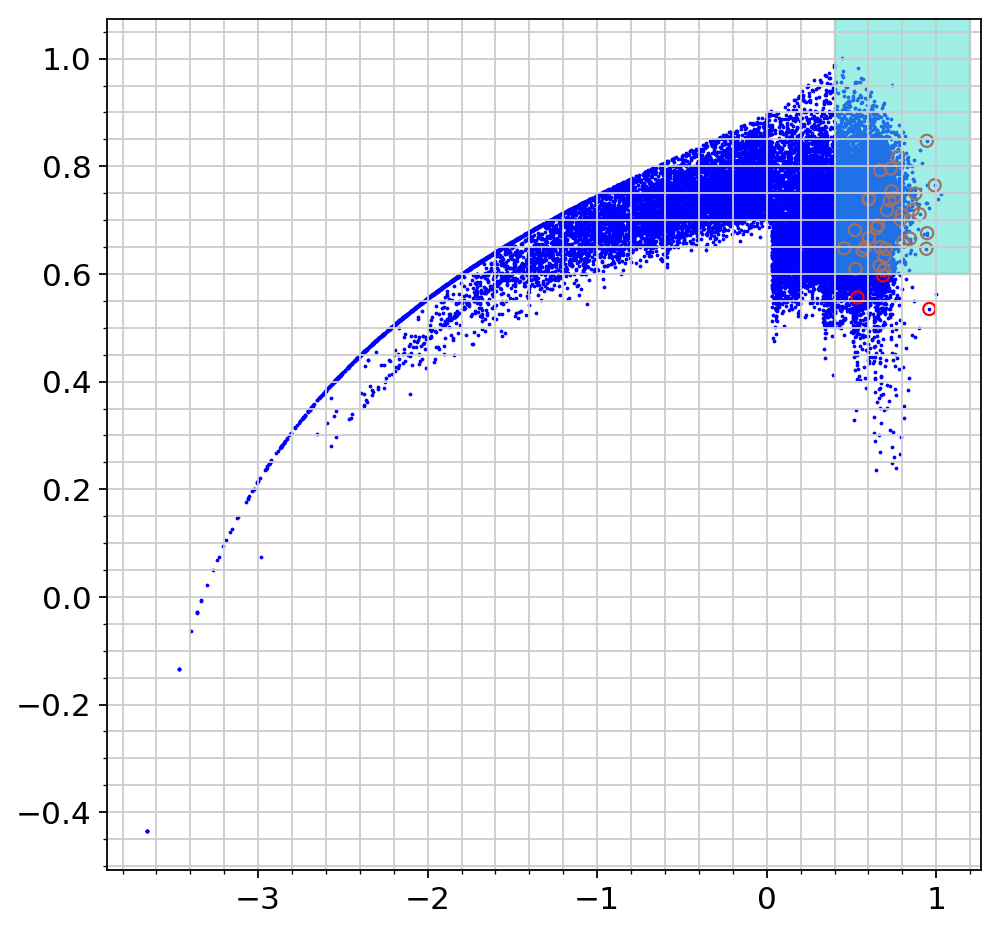

In [75]:
hv_plot(hv_adata, gate=gate, highlight_genes=good_genes)

In [76]:
genes = hv_genes(hv_adata, gate=gate)

In [77]:
sum(genes)

9137

In [78]:
concat_m_hv = hv_genes(hv_adata, gate=gate, adata=concat_m)

In [79]:
concat_m_hv_unscaled = concat_m_hv.copy()

## Dimensionality Reduction and Visualization

Standard processing steps here:

In [32]:
# sc.pp.scale(concat_m, max_value=10)
# sc.pp.scale(concat_h, max_value=10)
sc.pp.scale(concat, max_value=10)

    ... scale_data: as `zero_center=True`, sparse input is densified and may lead to large memory consumption
    ... clipping at max_value 10


I've played ALOT with changing the number of PCs to input into the neighbors function. If you visualize the variance ratio plot below on a linear scale, the "knee" of the plot is really only at PC10, but inputting only those 10 PCs makes the UMAP look worse than if inputting more. With the log-scale visualization, we observe little more variance up until a steady decline at about 40 or 50 PCs, and so that seems like it would be a logical choice. However, after experimenting with 100 PCs, I noted that it really smooths out the populations further, and cleanly separates out what I think is the "ambient" population of cells. For that reason, I've decided to use 100 PCs, but whatever results we do decide to use for this, we should make sure they are not extremely sensitive to the number of input PCs.

In [33]:
# sc.pp.pca(concat_m, n_comps=100)
# sc.pp.pca(concat_h, n_comps=100)
sc.pp.pca(concat, n_comps=100)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 100
    finished (0:00:59)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


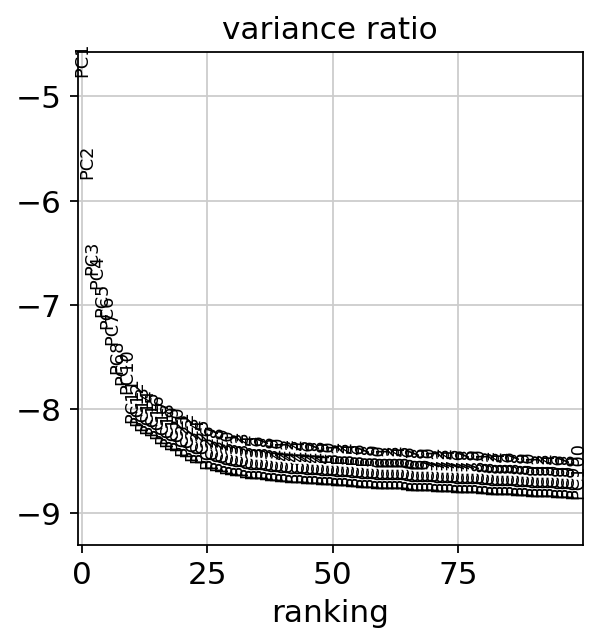

In [34]:
# sc.pl.pca_variance_ratio(concat_m,log=True, n_pcs=100)
# sc.pl.pca_variance_ratio(concat_h,log=True, n_pcs=100)
sc.pl.pca_variance_ratio(concat,log=True, n_pcs=100)

If you'd like to visualize PCA loadings:

In [ ]:
cols = 8
rows = 5

In [ ]:
for x, y in zip(np.arange(rows)*cols+1, np.arange(1,rows+1)*cols + 1):
    sc.pl.pca_loadings(concat, components=range(x,y));

In [35]:
# warnings.filterwarnings('ignore')
# sc.pp.neighbors(concat_m,n_neighbors=15,n_pcs=50) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
# warnings.filterwarnings('default')

# warnings.filterwarnings('ignore')
# sc.pp.neighbors(concat_h,n_neighbors=15,n_pcs=25) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
# warnings.filterwarnings('default')

warnings.filterwarnings('ignore')
sc.pp.neighbors(concat,n_neighbors=15,n_pcs=100) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')

computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 100
    computed neighbors (0:00:35)
    computed connectivities (0:00:03)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:38)


In [36]:
# sc.tl.umap(concat_m)
# sc.tl.umap(concat_h)
sc.tl.umap(concat)

computing UMAP
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:25)


In [37]:
# sc.tl.leiden(concat_m,resolution=0.5)
# sc.tl.leiden(concat_h,resolution=0.5)
sc.tl.leiden(concat,resolution=0.8)

running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:10)


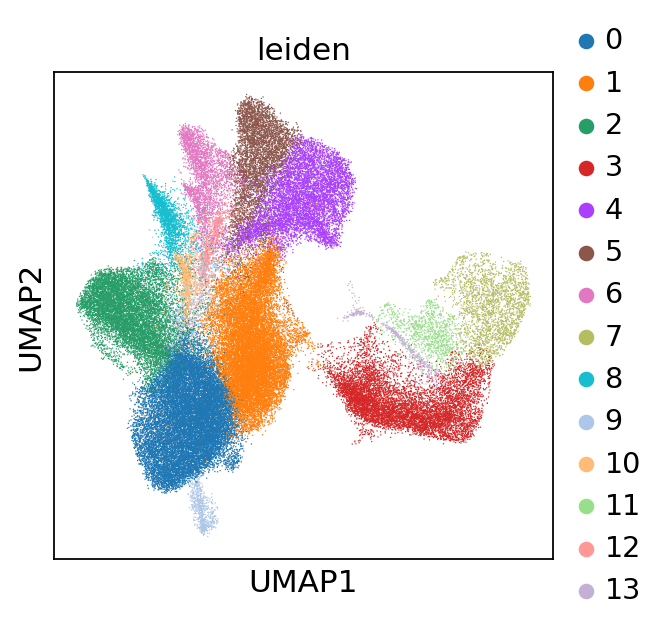

In [41]:
# sc.pl.umap(concat_m, color='leiden', palette=sc.pl.palettes.vega_20_scanpy)
# sc.pl.umap(concat_h, color='leiden', palette=sc.pl.palettes.vega_20_scanpy)
sc.pl.umap(concat, color='leiden')

See how smooth and nicely segregated leiden cluster 1 is? That was not happening at 50 PCs. That's what I believe to be the ambient RNA cluster.

Visualize batch now:

In [39]:
batches = concat.obs['batch'].unique() # get a list of the batches
# make a new column in the `.obs` for each batch that is of dtype `int` and that just takes on values of 0 and 1 so that it gets plotted as a continuous variable instead of a categorical one
for batch in batches:
    concat.obs['batch_%s' % batch] = (concat.obs['batch'] == batch).astype(int)

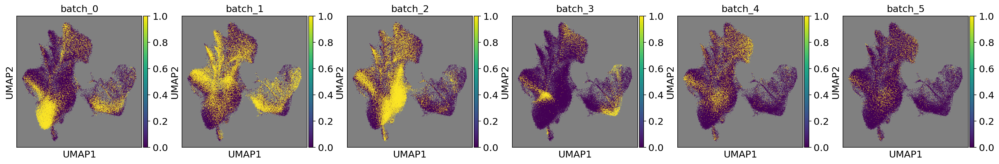

In [40]:
fig, ax = plt.subplots(1, 6, figsize=(25,3.5))
# make a new column in the `.obs` for each batch that is of dtype `int` so that it gets plotted as a continuous variable instead of a categorical one
for batch, ax in zip(batches, np.ravel(ax)):
    ax.set_facecolor('gray')
    sc.pl.umap(concat, color=['batch_%s' % batch], ax=ax, sort_order=True, show=False, return_fig=False)

In [4]:
# concat.write_h5ad('/data/xyzeq/xyzeq/concatenated.deep/deep2/concat.deep.2.h5ad')
concat = sc.read_h5ad('/data/xyzeq/xyzeq/concatenated.deep/deep2/concat.deep.2.h5ad')

I want to pull out those small satellite clusters to figure out what they are. 

In [42]:
sub_concats = dict() # put the new subsetted concat objects in a dictionary of concats
sub_concats['0'] = concat[concat.obs['leiden'] == '0'].copy()
sub_concats['1'] = concat[concat.obs['leiden'] == '1'].copy()
sub_concats['2'] = concat[concat.obs['leiden'] == '2'].copy()

running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:05)


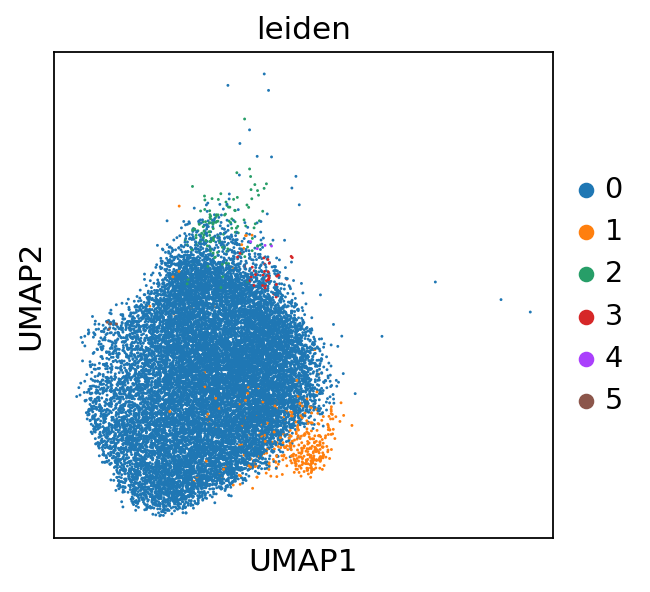

In [43]:
sc.tl.leiden(sub_concats['0'], resolution=0.3) # subcluster them using Leiden
sc.pl.umap(sub_concats['0'], color='leiden')

In [44]:
ctdict = dict()
ctdict['ct0'] = [0, 2, 3, 4, 5]
ctdict['ct1'] = [1]
sub_concats['0'].obs['celltype'] = sub_concats['0'].obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        sub_concats['0'].obs['celltype'].replace(r'^%s$' % str(clust), ct, regex=True, inplace=True)
sub_concats['0'].obs['leiden'] = [i.strip('ct') for i in sub_concats['0'].obs['celltype'].astype('category')]

running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:04)


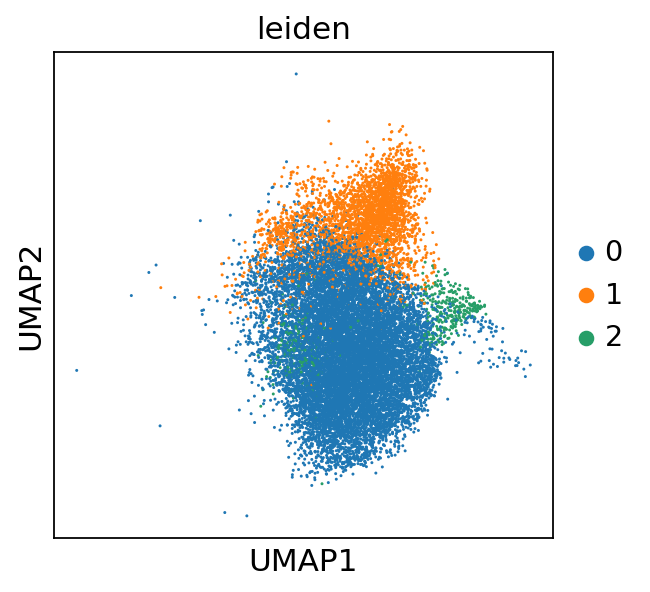

In [45]:
sc.tl.leiden(sub_concats['1'], resolution=0.3) # subcluster them using Leiden
sc.pl.umap(sub_concats['1'], color='leiden')

running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)


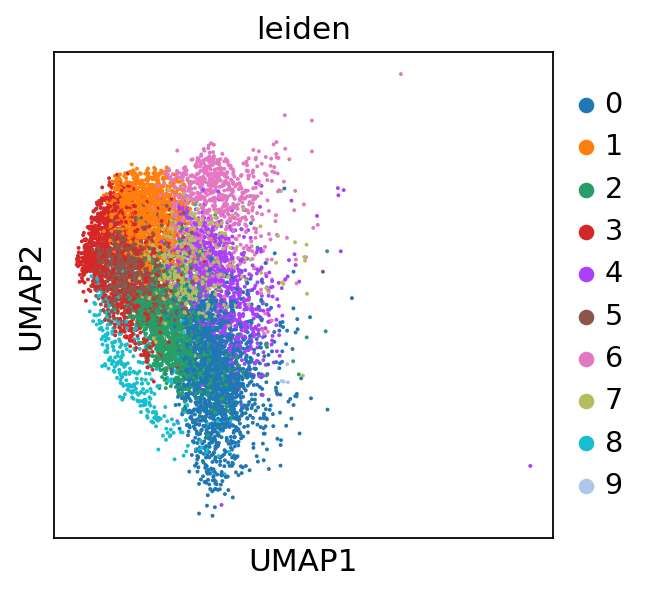

In [46]:
sc.tl.leiden(sub_concats['2'], resolution=0.9) # subcluster them using Leiden
sc.pl.umap(sub_concats['2'], color='leiden')

In [47]:
ctdict = dict()
ctdict['ct0'] = [0, 1, 2, 3, 4, 5, 7, 9]
ctdict['ct1'] = [6]
ctdict['ct2'] = [8]
sub_concats['2'].obs['celltype'] = sub_concats['2'].obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        sub_concats['2'].obs['celltype'].replace(r'^%s$' % str(clust), ct, regex=True, inplace=True)
sub_concats['2'].obs['leiden'] = [i.strip('ct') for i in sub_concats['2'].obs['celltype'].astype('category')]

Map them back to the clusters on the original adata

In [48]:
def sub_cluster_mapper(adata, sub_adatas):
    '''
    This takes in the adata object and inserts a new leiden column in the `.obs`. 
    
    This function is really convoluted and there's probably a better, simpler way to do it,
    but it should theoretically work for any number of subclusters
    '''
    # ideally you'd make a copy of the adata object here, so we don't have to change the original
    # this would be in case we want to run it multiple times, perhaps the resolutions we put in didn't subset the clusters like we had hoped
    # and we need to run multiple times to adjust the resolution slightly
    
    # this block is to figure out that there are two new subclusters and they should be named 8, 9
    total_new_clusts = 0
    old_clusts = sub_adatas.keys()
    for sub_adata in sub_adatas:
        total_new_clusts += sub_adatas[sub_adata].obs['leiden'].astype(int).unique().max() + 1
    total_added_clusts = total_new_clusts - len(sub_adatas)
    new_clust_names_start = max(adata.obs['leiden'].astype(int))+1
    new_added_clust_names = [str(i) for i in range(new_clust_names_start,
                                                   new_clust_names_start + total_added_clusts)]
    
    # this block is to build a new list of leiden clusters from the old one 
    new_leiden = list()
    leiden_col = adata.obs['leiden'].copy()

    # this builds the new leiden cluster list, now adding a .1, .2, etc. to each new cluster
    for obs in leiden_col.index:
        clust_name = leiden_col.loc[obs]
        if clust_name not in old_clusts or sub_adatas[clust_name].obs.loc[obs, 'leiden'] == '0':
            new_leiden.append(clust_name)
        else:
            new_leiden.append(clust_name + '.%s' % sub_adatas[clust_name].obs.loc[obs,'leiden'])

    # this renames the .1, .2, etc clusters to the new, better names I came up with above (8 and 9)
    new_leiden = pd.Series(new_leiden, index=adata.obs_names)
    added_clusts = np.setdiff1d(new_leiden,adata.obs['leiden'])
    new_leiden.replace(dict(zip(added_clusts, new_added_clust_names)), inplace=True)
    
    # replace the old leiden column, must do these steps sequentially 
    adata.obs['leiden'] = new_leiden.astype(int) # to order the clusters by number
    adata.obs['leiden'] = new_leiden.astype(str) # to convert to string as normal
#     adata.obs['leiden'] = new_leiden.astype('category') # don't do this, it messes things up, just let scanpy do it as it plots
    return adata

In [49]:
concat = sub_cluster_mapper(concat, sub_concats)

... storing 'leiden' as categorical


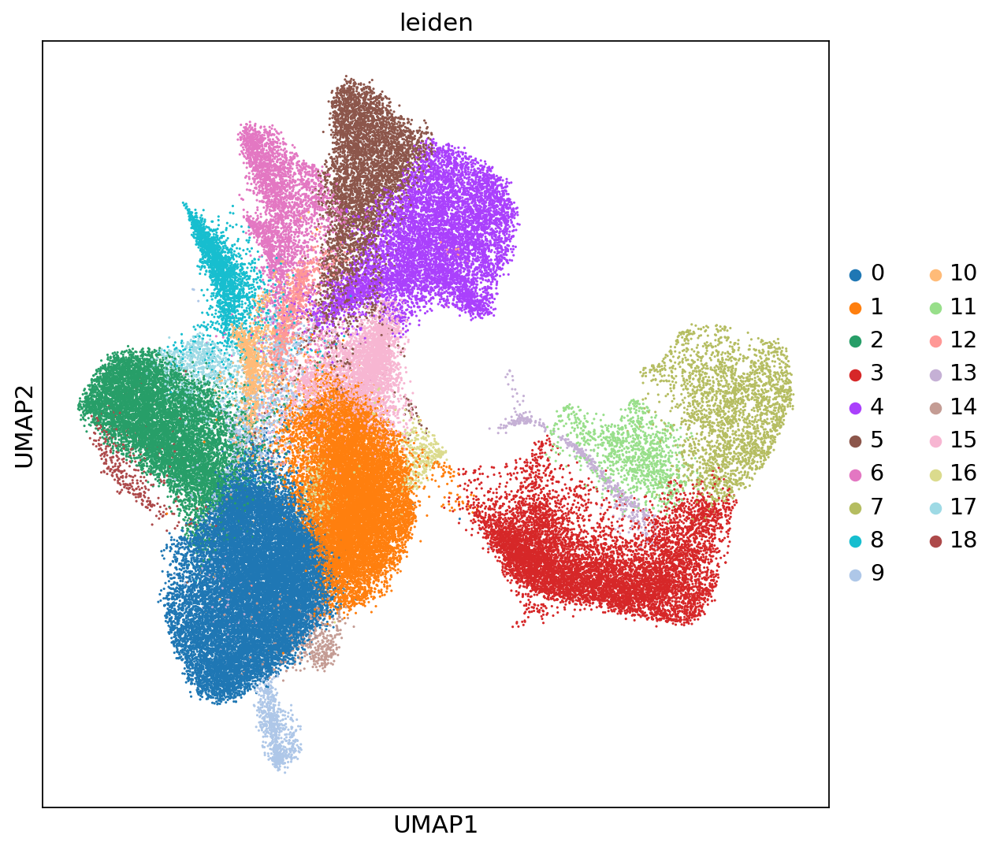

In [50]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
sc.pl.umap(concat, ax=ax, show=False, return_fig=False, color='leiden', size=8, palette=sc.pl.palettes.default_20    );#  , groups=['9']);

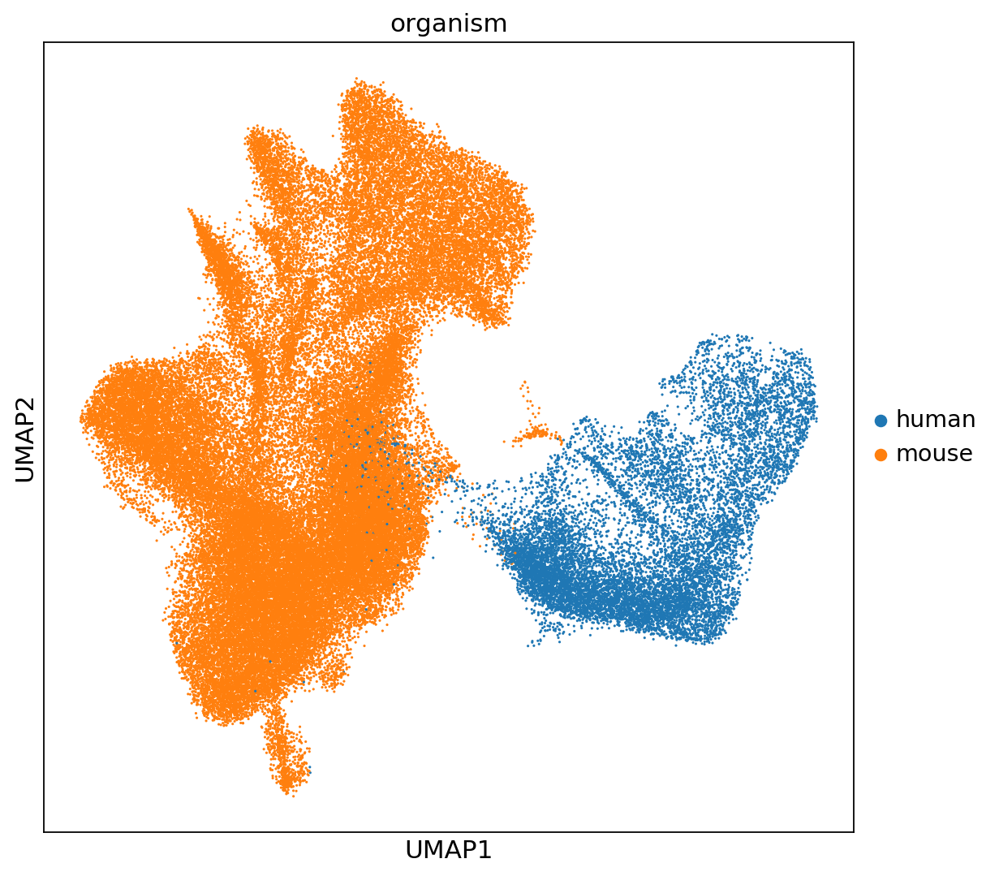

In [51]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
sc.pl.umap(concat, ax=ax, show=False, return_fig=False, color='organism', size=8, palette=sc.pl.palettes.default_20   );#   , groups=['28']);

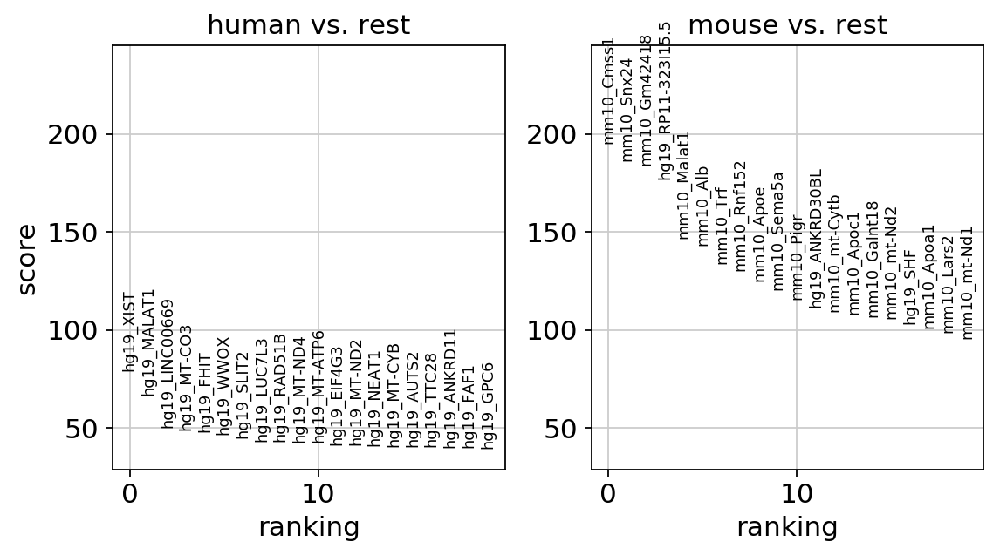

In [52]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(concat, groupby='organism', n_genes=200)
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(concat)
sc.settings.verbosity = 4

It's not a good sign when human genes are showing up in what we think are mouse cells in the differential expression analysis.

Here I'll try to visualize the human genes that are showing up in mouse cells, accompanies by their mouse gene counterparts.

In [53]:
for i in [i for i in concat.uns['rank_genes_groups']['names']['mouse'] if i.startswith('hg19_')]:
    gene = i[5:]
    gene = gene[0] + gene[1:].lower()
    if 'mm10_' + gene in concat.var_names:
        print(i)

hg19_SHF
hg19_HFM1
hg19_ALB
hg19_SMC5
hg19_SLCO5A1
hg19_CUL9
hg19_COL19A1


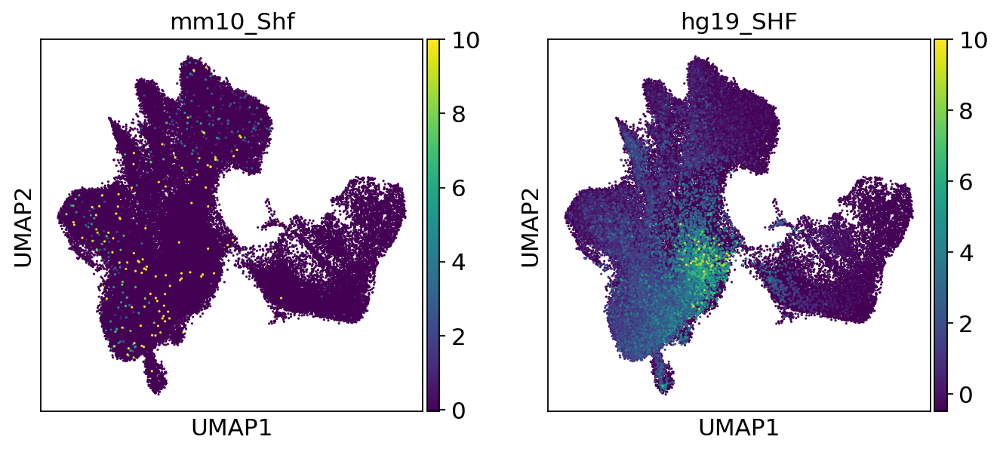

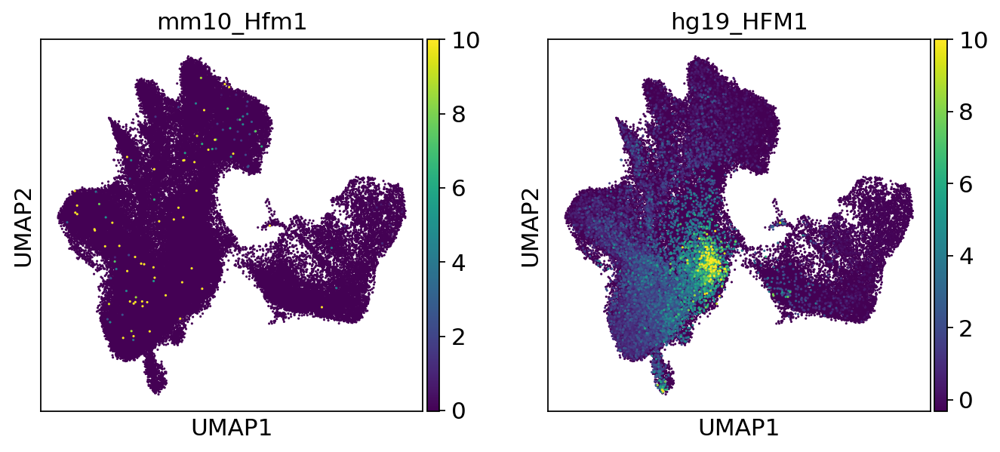

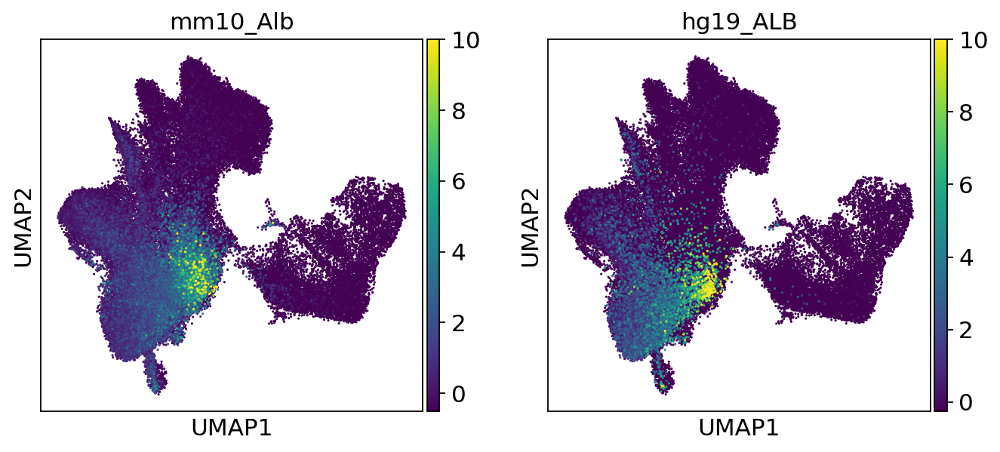

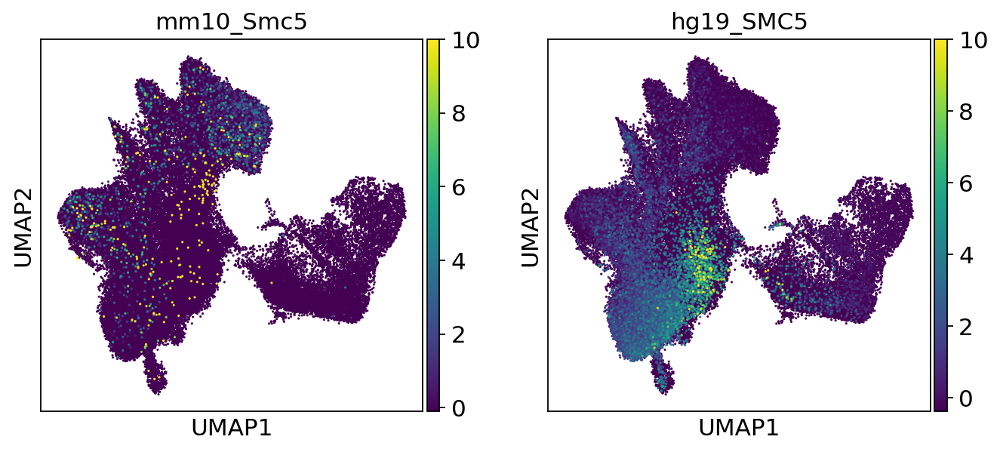

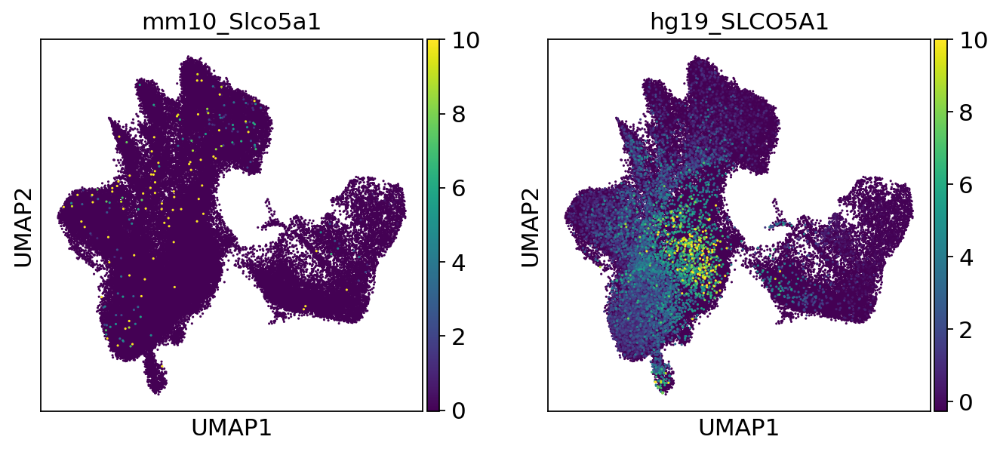

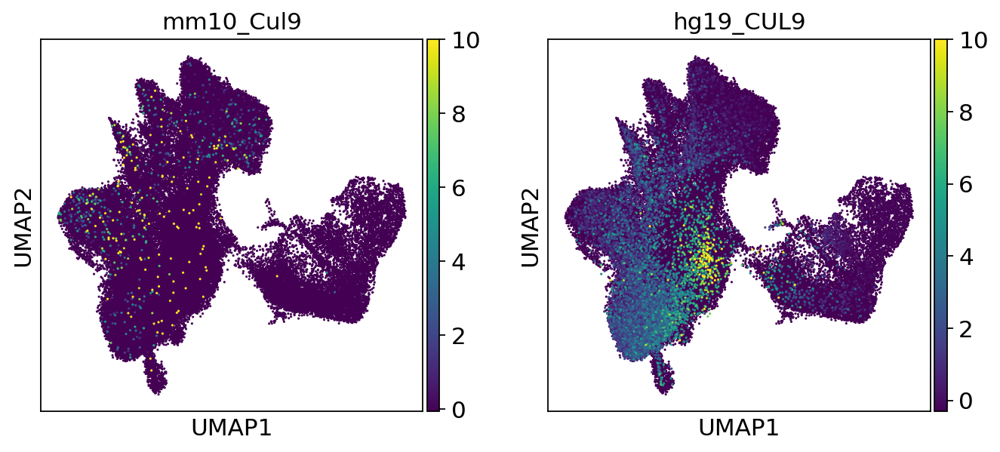

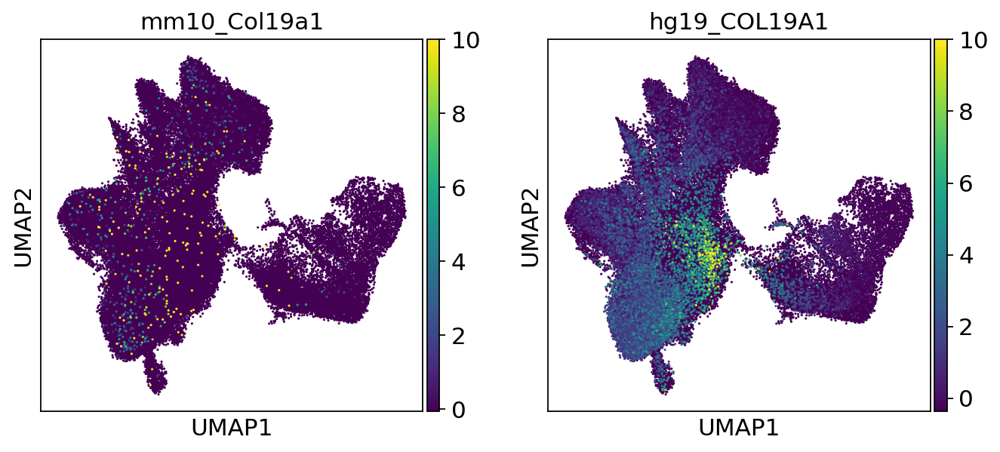

In [55]:
sc.pl.umap(concat, color=['mm10_Shf', 'hg19_SHF'], size=8);
sc.pl.umap(concat, color=['mm10_Hfm1', 'hg19_HFM1'], size=8);
sc.pl.umap(concat, color=['mm10_Alb', 'hg19_ALB'], size=8);
sc.pl.umap(concat, color=['mm10_Smc5', 'hg19_SMC5'], size=8);
sc.pl.umap(concat, color=['mm10_Slco5a1', 'hg19_SLCO5A1'], size=8);
sc.pl.umap(concat, color=['mm10_Cul9', 'hg19_CUL9'], size=8);
sc.pl.umap(concat, color=['mm10_Col19a1', 'hg19_COL19A1'], size=8);

Now differential expression:

In [57]:
concat_m = concat[concat.obs['organism'] == 'mouse'].copy()
concat_h = concat[concat.obs['organism'] == 'human'].copy()

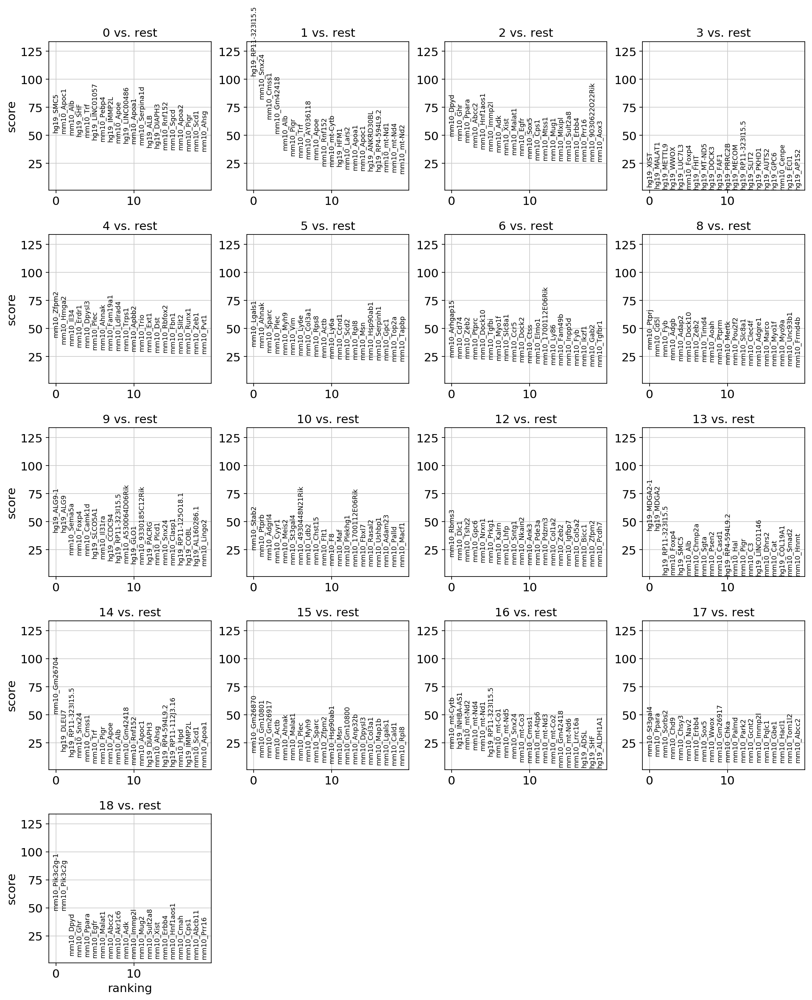

In [58]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(concat_m, groupby='leiden')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(concat_m)
sc.settings.verbosity = 4

So I clustered on the the genes from both genomes, but in the end I of course want to only look at mouse genes for those cell barcodes that are definitively mouse. However, one justification for leaving the human genes in to cluster would be to identify those cell barcodes that are low quality and hence filled with transcripts from the two different organisms. By using the human genes, I can then Identify and remove those clusters that are made up of low quality cell barcodes. However, a further complication is that the cell barcodes that seem to cluster as hepatocytes contain a bunch of human transcripts whereas the other cell types (cancer and special cell types) dont. It could be because the hepatocytes are larger and more plentiful, they might have sopped up more ambient RNA than other cell types. However, I can't use a simple filter for filtering cluters based on expressing both human and mouse transcipts unless I take into account the size of the cluster. In any case, I'm just going to remove those that I think are not true cell types.

In [59]:
ctdict = dict()
ctdict['Real'] = [0, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 17]
ctdict['Ambient'] = [1, 9, 13, 14, 15, 16, 18]
concat.obs['celltype'] = concat.obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        concat.obs['celltype'].replace(r'^%s$' % str(clust), ct, regex=True, inplace=True)
concat.obs['celltype'] = concat.obs['celltype'].astype('category')

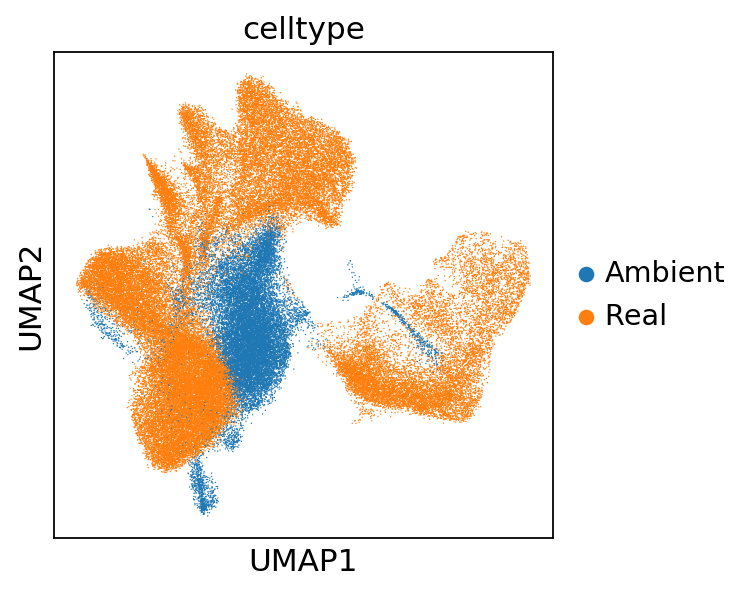

In [60]:
sc.pl.umap(concat, color='celltype', palette=sc.pl.palettes.vega_20_scanpy)

In [61]:
concat = concat[concat.obs['celltype'] == 'Real'].copy()

I'm just computing 100 components again and inputting that.

In [ ]:
sc.pp.pca(concat, n_comps=100)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 100


In [63]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(concat,n_neighbors=15,n_pcs=100) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')

computing neighbors
        initialized `.distances` `.connectivities` 
    computing neighbors
    using 'X_pca' with n_pcs = 100
    computed neighbors (0:00:25)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:27)


In [64]:
sc.tl.umap(concat)

computing UMAP
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:02)


In [65]:
sc.tl.leiden(concat,resolution=0.8)

running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:28)


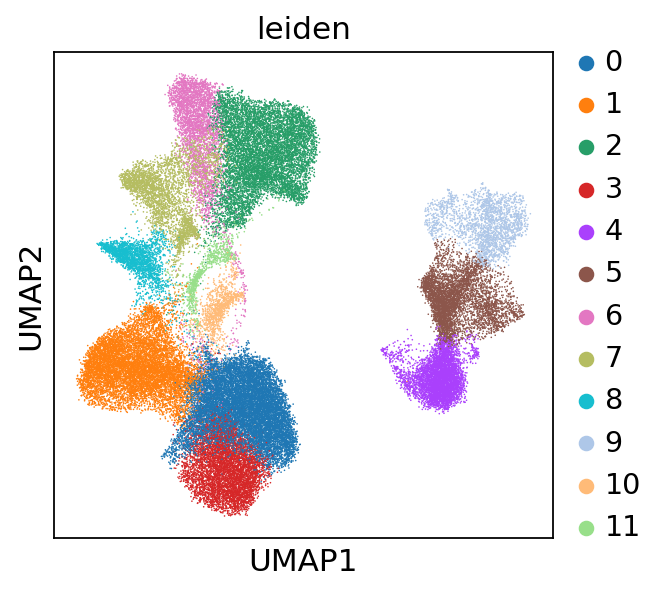

In [66]:
sc.pl.umap(concat, color='leiden', palette=sc.pl.palettes.default_20)

In [67]:
ctdict = dict()
ctdict['Hepatocyte'] = [0, 1, 3]
ctdict['Special'] = [7, 8, 10, 11]
ctdict['Cancer'] = [2, 6]
ctdict['Human'] = [4, 5, 9]
concat.obs['celltype'] = concat.obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        concat.obs['celltype'].replace(r'^%s$' % str(clust), ct, regex=True, inplace=True)
concat.obs['celltype'] = concat.obs['celltype'].astype('category')

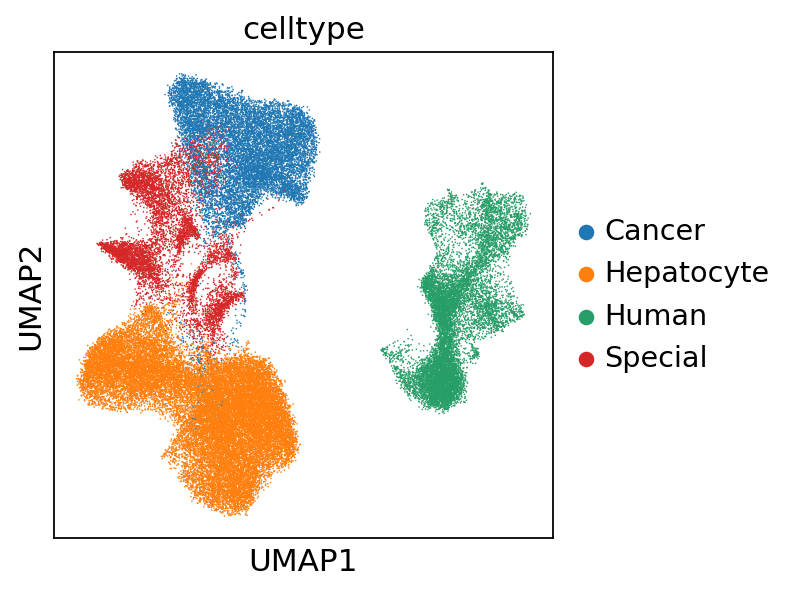

In [68]:
sc.pl.umap(concat,color='celltype')

In [69]:
special = concat[concat.obs['celltype'] == 'Special'].copy()
special = special[:, [i for i in special.var_names if i.startswith('mm10_')]].copy()
special.var_names = [i[5:] for i in special.var_names]
special.var_names_make_unique()

In [121]:
special.shape

(7545, 15466)

With these smaller number of cells, I'm going to experiment further with what number of PCs to use. It just seems like using more and more PCs is better.

In [137]:
sc.pp.pca(special,n_comps=min(special.shape))

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 7545
    finished (0:01:38)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


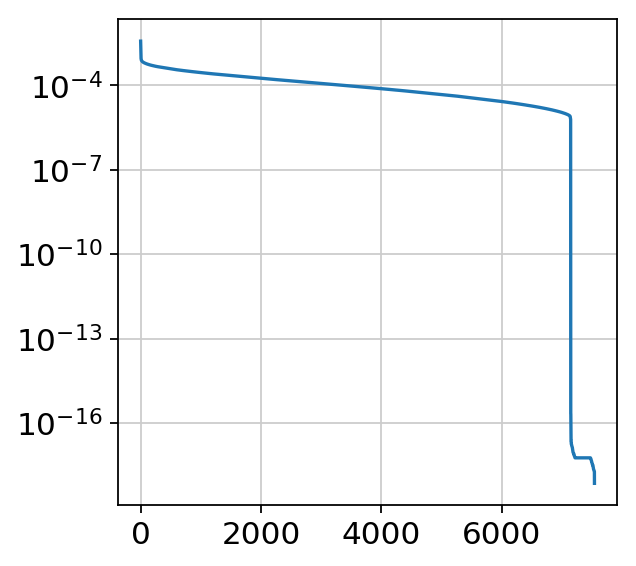

In [142]:
plt.plot(special.uns['pca']['variance_ratio'])
plt.yscale('log');

Wow, that is quite the precipitous drop. That definitely seems artifactual (maybe down to floating point error or something?). Let's figure out where it is though.

In [146]:
(special.uns['pca']['variance_ratio'] > 1e-7).sum()

7149

This is what happens when we choose no PCs, and just use the raw:

In [ ]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(special,n_neighbors=15,n_pcs=0) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')

In [107]:
sc.tl.umap(special)

computing UMAP
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:20)


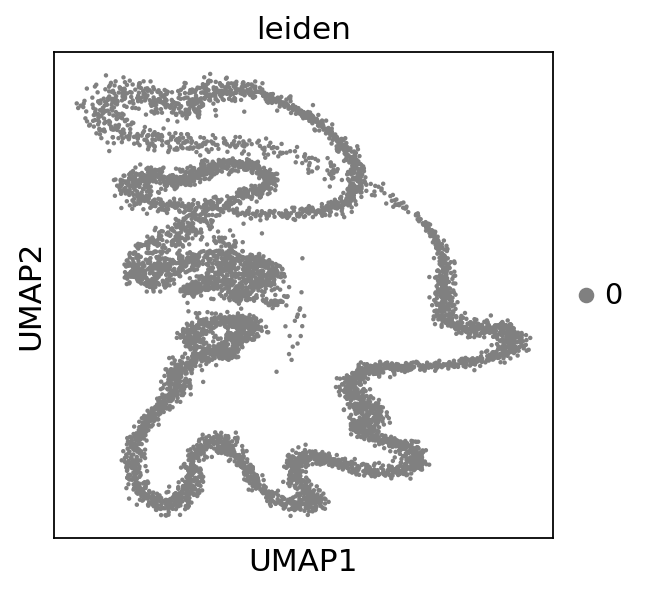

In [120]:
sc.pl.umap(special)

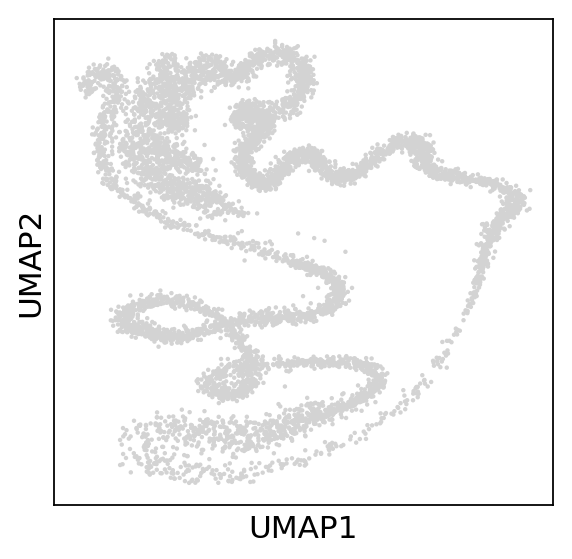

In [151]:
sc.settings.verbosity = 0
warnings.filterwarnings('ignore')
sc.pp.neighbors(special,n_neighbors=15,n_pcs=7100) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')
sc.tl.umap(special)
sc.settings.verbosity = 4
sc.pl.umap(special)

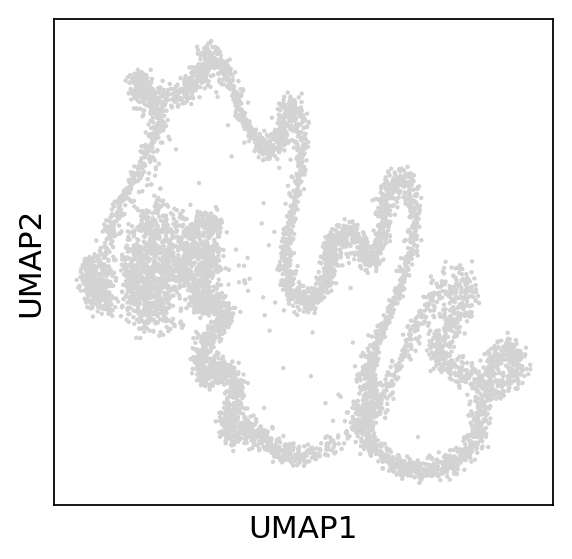

In [152]:
sc.settings.verbosity = 0
warnings.filterwarnings('ignore')
sc.pp.neighbors(special,n_neighbors=15,n_pcs=4000) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')
sc.tl.umap(special)
sc.settings.verbosity = 4
sc.pl.umap(special)

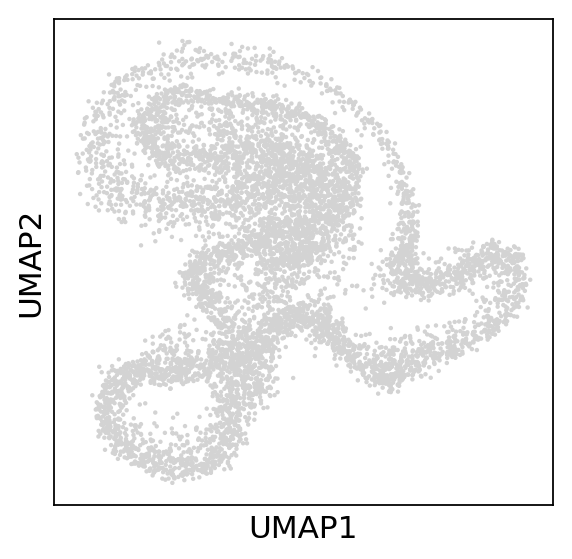

In [153]:
sc.settings.verbosity = 0
warnings.filterwarnings('ignore')
sc.pp.neighbors(special,n_neighbors=15,n_pcs=2000) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')
sc.tl.umap(special)
sc.settings.verbosity = 4
sc.pl.umap(special)

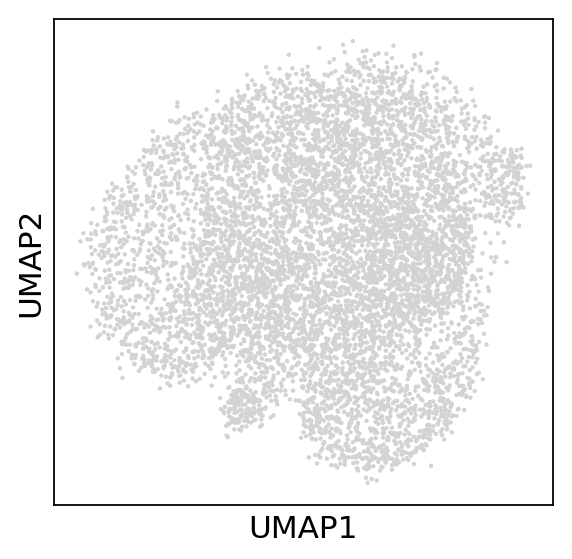

In [154]:
sc.settings.verbosity = 0
warnings.filterwarnings('ignore')
sc.pp.neighbors(special,n_neighbors=15,n_pcs=1000) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')
sc.tl.umap(special)
sc.settings.verbosity = 4
sc.pl.umap(special)

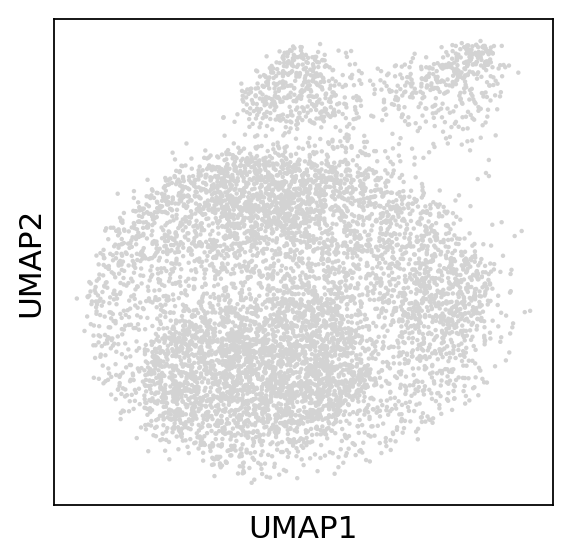

In [155]:
sc.settings.verbosity = 0
warnings.filterwarnings('ignore')
sc.pp.neighbors(special,n_neighbors=15,n_pcs=500) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')
sc.tl.umap(special)
sc.settings.verbosity = 4
sc.pl.umap(special)

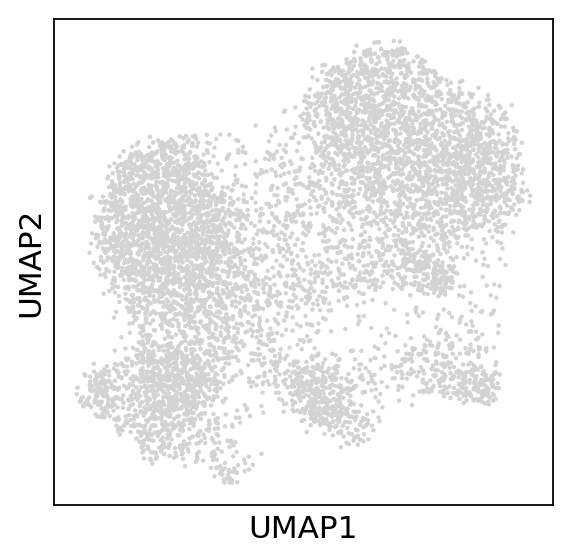

In [156]:
sc.settings.verbosity = 0
warnings.filterwarnings('ignore')
sc.pp.neighbors(special,n_neighbors=15,n_pcs=300) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')
sc.tl.umap(special)
sc.settings.verbosity = 4
sc.pl.umap(special)

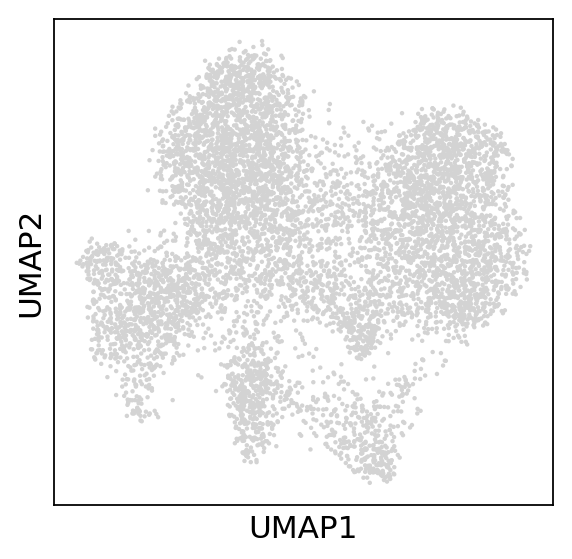

In [158]:
sc.settings.verbosity = 0
warnings.filterwarnings('ignore')
sc.pp.neighbors(special,n_neighbors=15,n_pcs=200) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')
sc.tl.umap(special)
sc.settings.verbosity = 4
sc.pl.umap(special)

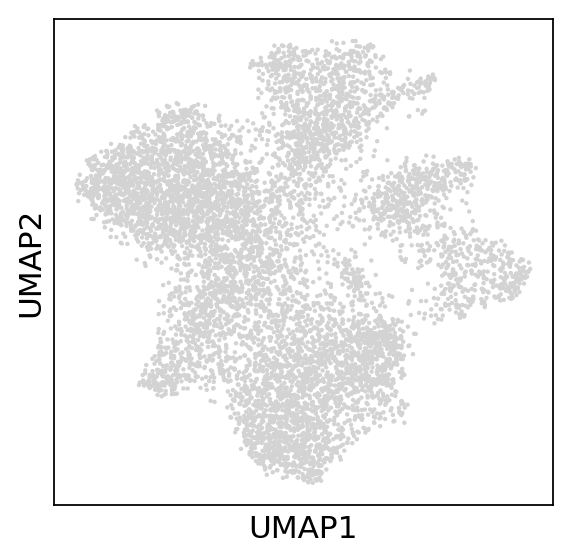

In [159]:
sc.settings.verbosity = 0
warnings.filterwarnings('ignore')
sc.pp.neighbors(special,n_neighbors=15,n_pcs=100) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')
sc.tl.umap(special)
sc.settings.verbosity = 4
sc.pl.umap(special)

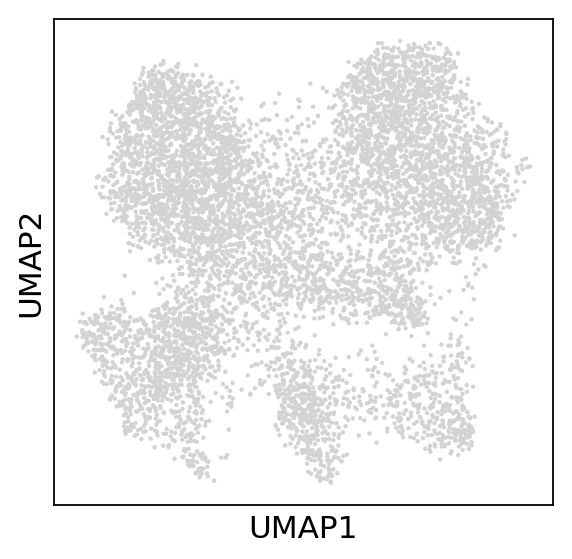

In [160]:
sc.settings.verbosity = 0
warnings.filterwarnings('ignore')
sc.pp.neighbors(special,n_neighbors=15,n_pcs=150) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')
sc.tl.umap(special)
sc.settings.verbosity = 4
sc.pl.umap(special)

Wow, that's pretty incredible. If I had just used the "elbow" rule, I would not have pulled out as much heterogeneity. Maybe I should try the same thing on the full dataset, though I know it will probably take much longer. 

Okay, I think I like 300 the best. I tried 200 because it looked like it was separating out the bottom left cluster into 3 more subtypes the best (while the other ones were separating out 2), but that extra one is just driven by the background genes (Snx24, Alb, etc.) so I'm going with 300.

In [ ]:
sc.settings.verbosity = 0
warnings.filterwarnings('ignore')
sc.pp.neighbors(special,n_neighbors=15,n_pcs=300) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')
sc.tl.umap(special)
sc.settings.verbosity = 4

In [203]:
sc.tl.leiden(special, resolution=1)

running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


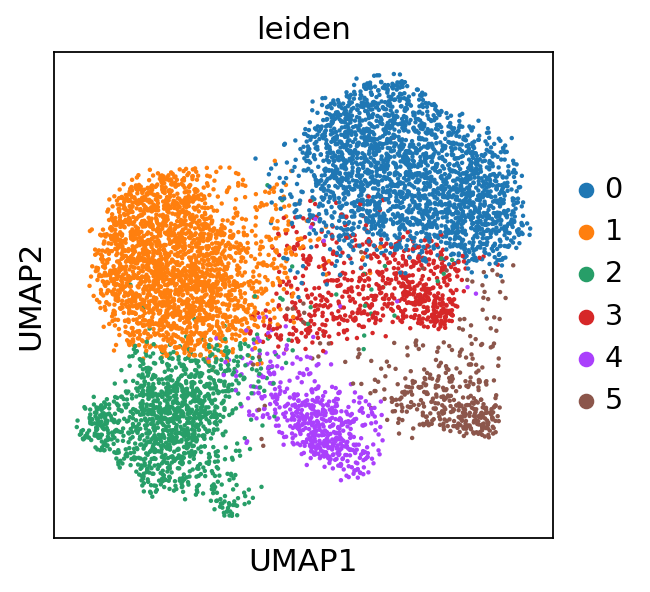

In [204]:
sc.pl.umap(special, color='leiden', palette=sc.pl.palettes.default_20)

In [205]:
sub_specials = dict() # put the new subsetted special objects in a dictionary of specials
sub_specials['2'] = special[special.obs['leiden'] == '2'].copy()

running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


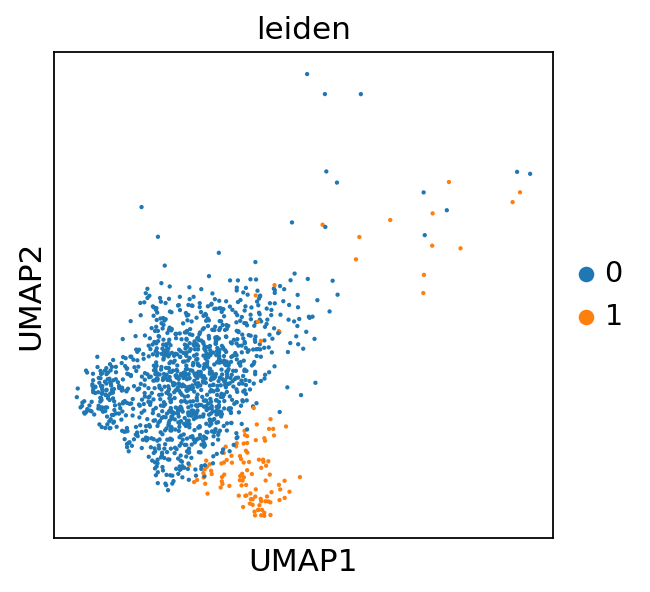

In [208]:
sc.tl.leiden(sub_specials['2'], resolution=0.4) # subcluster them using Leiden
sc.pl.umap(sub_specials['2'], color='leiden', size=15)

Map them back to the clusters on the original adata

In [209]:
def sub_cluster_mapper(adata, sub_adatas):
    '''
    This takes in the adata object and inserts a new leiden column in the `.obs`. 
    
    This function is really convoluted and there's probably a better, simpler way to do it,
    but it should theoretically work for any number of subclusters
    '''
    # ideally you'd make a copy of the adata object here, so we don't have to change the original
    # this would be in case we want to run it multiple times, perhaps the resolutions we put in didn't subset the clusters like we had hoped
    # and we need to run multiple times to adjust the resolution slightly
    
    # this block is to figure out that there are two new subclusters and they should be named 8, 9
    total_new_clusts = 0
    old_clusts = sub_adatas.keys()
    for sub_adata in sub_adatas:
        total_new_clusts += sub_adatas[sub_adata].obs['leiden'].astype(int).unique().max() + 1
    total_added_clusts = total_new_clusts - len(sub_adatas)
    new_clust_names_start = max(adata.obs['leiden'].astype(int))+1
    new_added_clust_names = [str(i) for i in range(new_clust_names_start,
                                                   new_clust_names_start + total_added_clusts)]
    
    # this block is to build a new list of leiden clusters from the old one 
    new_leiden = list()
    leiden_col = adata.obs['leiden'].copy()

    # this builds the new leiden cluster list, now adding a .1, .2, etc. to each new cluster
    for obs in leiden_col.index:
        clust_name = leiden_col.loc[obs]
        if clust_name not in old_clusts or sub_adatas[clust_name].obs.loc[obs, 'leiden'] == '0':
            new_leiden.append(clust_name)
        else:
            new_leiden.append(clust_name + '.%s' % sub_adatas[clust_name].obs.loc[obs,'leiden'])

    # this renames the .1, .2, etc clusters to the new, better names I came up with above (8 and 9)
    new_leiden = pd.Series(new_leiden, index=adata.obs_names)
    added_clusts = np.setdiff1d(new_leiden,adata.obs['leiden'])
    new_leiden.replace(dict(zip(added_clusts, new_added_clust_names)), inplace=True)
    
    # replace the old leiden column, must do these steps sequentially 
    adata.obs['leiden'] = new_leiden.astype(int) # to order the clusters by number
    adata.obs['leiden'] = new_leiden.astype(str) # to convert to string as normal
#     adata.obs['leiden'] = new_leiden.astype('category') # don't do this, it messes things up, just let scanpy do it as it plots
    return adata

In [210]:
special = sub_cluster_mapper(special, sub_specials)

In [218]:
sc.tl.umap(special, spread=3, min_dist=1)

computing UMAP
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:20)


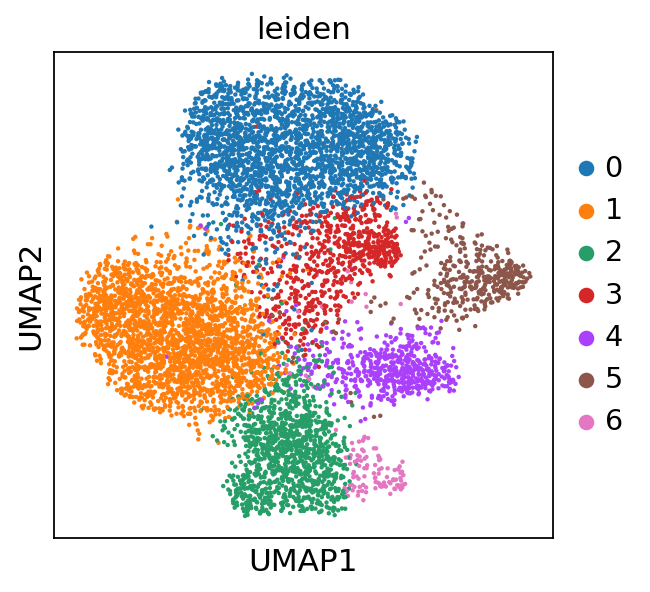

In [226]:
sc.pl.umap(special,color=['leiden'])

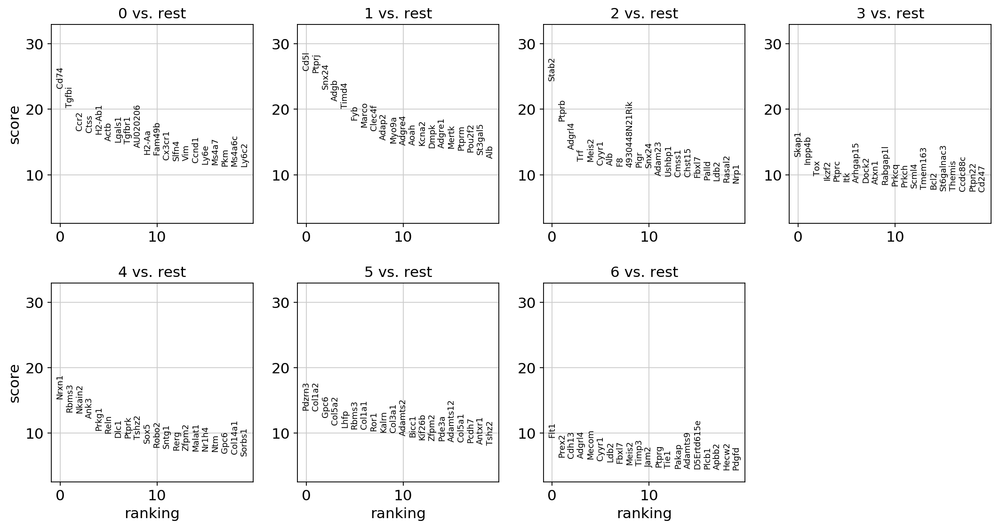

In [220]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(special, groupby='leiden')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(special)
sc.settings.verbosity = 4